# Importing Libraries:

In [204]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
%matplotlib inline
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression,Ridge
import numpy.random as rnd
import statsmodels.api as sm
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.tools as tls
import plotly.figure_factory as ff
#import lightgbm as lgbm
import plotly.tools as tls
from collections import Counter
import missingno as msno
from sklearn.neighbors import LocalOutlierFactor
from warnings import filterwarnings

In [205]:
filterwarnings("ignore", category=DeprecationWarning) 
filterwarnings("ignore", category=FutureWarning) 
filterwarnings("ignore", category=UserWarning)

In [206]:
from dataprep.datasets import load_dataset

In [207]:
from dataprep.eda import plot
from dataprep.eda import plot_diff
from dataprep.eda import plot_correlation
from dataprep.eda import plot_missing

In [208]:
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split, cross_val_score, cross_val_predict
from sklearn import model_selection
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingRegressor, GradientBoostingClassifier
import xgboost as xgb
from xgboost import XGBRegressor, XGBClassifier
from lightgbm import LGBMRegressor, LGBMClassifier
from catboost import CatBoostRegressor, CatBoostClassifier
from imblearn.over_sampling import SMOTE
from collections import Counter
from sklearn.metrics import mean_squared_error, mean_absolute_error, confusion_matrix, r2_score, accuracy_score
from sklearn.model_selection import (GridSearchCV, KFold, train_test_split, cross_val_score)
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier
from sklearn import svm
from xgboost.sklearn import XGBClassifier
from sklearn.tree import DecisionTreeClassifier
from catboost import CatBoostClassifier
from sklearn import metrics

# Statistical Analysis:

In [209]:
data = pd.read_csv('//Users//omniaelmenshawy//Desktop///water_potability.csv', sep=',', encoding='utf-8')
data.head(5)

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
0,NaN,204.890455,20791.318981,7.300212,368.516441,564.308654,10.379783,86.990970,2.963135,0
1,3.716080,129.422921,18630.057858,6.635246,NaN,592.885359,15.180013,56.329076,4.500656,0
2,8.099124,224.236259,19909.541732,9.275884,NaN,418.606213,16.868637,66.420093,3.055934,0
3,8.316766,214.373394,22018.417441,8.059332,356.886136,363.266516,18.436524,100.341674,4.628771,0
4,9.092223,181.101509,17978.986339,6.546600,310.135738,398.410813,11.558279,31.997993,4.075075,0


In [15]:
data['Potability'].value_counts()

0    1998
1    1278
Name: Potability, dtype: int64

In [16]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3276 entries, 0 to 3275
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   ph               2785 non-null   float64
 1   Hardness         3276 non-null   float64
 2   Solids           3276 non-null   float64
 3   Chloramines      3276 non-null   float64
 4   Sulfate          2495 non-null   float64
 5   Conductivity     3276 non-null   float64
 6   Organic_carbon   3276 non-null   float64
 7   Trihalomethanes  3114 non-null   float64
 8   Turbidity        3276 non-null   float64
 9   Potability       3276 non-null   int64  
dtypes: float64(9), int64(1)
memory usage: 256.1 KB


In [210]:
df = data.copy()

In [211]:
df_visual = data.copy()

In [212]:
data = data[['ph', 'Hardness', 'Solids', 'Chloramines', 'Sulfate', 'Conductivity',
       'Organic_carbon', 'Trihalomethanes', 'Turbidity']]

In [213]:
df.describe().T.style.background_gradient(subset=['mean','std','50%','count'], cmap='PuBu')

,count,mean,std,min,25%,50%,75%,max
ph,2785.000000,7.080795,1.594320,0.000000,6.093092,7.036752,8.062066,14.000000
Hardness,3276.000000,196.369496,32.879761,47.432000,176.850538,196.967627,216.667456,323.124000
Solids,3276.000000,22014.092526,8768.570828,320.942611,15666.690297,20927.833607,27332.762127,61227.196008
Chloramines,3276.000000,7.122277,1.583085,0.352000,6.127421,7.130299,8.114887,13.127000
Sulfate,2495.000000,333.775777,41.416840,129.000000,307.699498,333.073546,359.950170,481.030642
Conductivity,3276.000000,426.205111,80.824064,181.483754,365.734414,421.884968,481.792304,753.342620
Organic_carbon,3276.000000,14.284970,3.308162,2.200000,12.065801,14.218338,16.557652,28.300000
Trihalomethanes,3114.000000,66.396293,16.175008,0.738000,55.844536,66.622485,77.337473,124.000000
Turbidity,3276.000000,3.966786,0.780382,1.450000,3.439711,3.955028,4.500320,6.739000
Potability,3276.000000,0.390110,0.487849,0.000000,0.000000,0.000000,1.000000,1.000000


In [14]:
df[df['Potability']==1].describe().T.style.background_gradient(subset=['mean','std','50%','count'], cmap='PuBu')

,count,mean,std,min,25%,50%,75%,max
ph,1101.000000,7.073783,1.448048,0.227499,6.179312,7.036752,7.933068,13.175402
Hardness,1278.000000,195.800744,35.547041,47.432000,174.330531,196.632907,218.003420,323.124000
Solids,1278.000000,22383.991018,9101.010208,728.750830,15668.985035,21199.386614,27973.236446,56488.672413
Chloramines,1278.000000,7.169338,1.702988,0.352000,6.094134,7.215163,8.199261,13.127000
Sulfate,985.000000,332.566990,47.692818,129.000000,300.763772,331.838167,365.941346,481.030642
Conductivity,1278.000000,425.383800,82.048446,201.619737,360.939023,420.712729,484.155911,695.369528
Organic_carbon,1278.000000,14.160893,3.263907,2.200000,12.033897,14.162809,16.356245,23.604298
Trihalomethanes,1223.000000,66.539684,16.327419,8.175876,56.014249,66.678214,77.380975,124.000000
Turbidity,1278.000000,3.968328,0.780842,1.492207,3.430909,3.958576,4.509569,6.494249
Potability,1278.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [15]:
df[df['Potability']==0].describe().T.style.background_gradient(subset=['mean','std','50%','count'], cmap='RdBu')

,count,mean,std,min,25%,50%,75%,max
ph,1684.000000,7.085378,1.683499,0.000000,6.037723,7.035456,8.155510,14.000000
Hardness,1998.000000,196.733292,31.057540,98.452931,177.823265,197.123423,216.120687,304.235912
Solids,1998.000000,21777.490788,8543.068788,320.942611,15663.057382,20809.618280,27006.249009,61227.196008
Chloramines,1998.000000,7.092175,1.501045,1.683993,6.155640,7.090334,8.066462,12.653362
Sulfate,1510.000000,334.564290,36.745549,203.444521,311.264006,333.389426,356.853897,460.107069
Conductivity,1998.000000,426.730454,80.047317,181.483754,368.498530,422.229331,480.677198,753.342620
Organic_carbon,1998.000000,14.364335,3.334554,4.371899,12.101057,14.293508,16.649485,28.300000
Trihalomethanes,1891.000000,66.303555,16.079320,0.738000,55.706530,66.542198,77.277704,120.030077
Turbidity,1998.000000,3.965800,0.780282,1.450000,3.444062,3.948076,4.496106,6.739000
Potability,1998.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [16]:
data.shape

(3276, 9)

## Data Report:

In [22]:
from dataprep.eda import create_report
report = create_report(df, title='My Report')

My Report
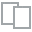
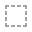
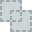
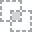
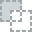
...
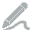
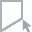
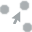
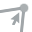
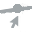

In [23]:
report

### Missing Values are:

In [24]:
def get_null_count(data):
    for i in data.columns:
        print(i,': ',len(data[data[i].isnull()][i]))

In [25]:
get_null_count(data)

ph :  491
Hardness :  0
Solids :  0
Chloramines :  0
Sulfate :  781
Conductivity :  0
Organic_carbon :  0
Trihalomethanes :  162
Turbidity :  0


Total Missing:  1434


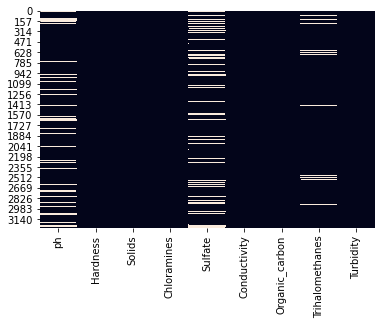

In [214]:
sns.heatmap(data.isnull(), cbar=False)
print("Total Missing: ", data.isna().sum().values.sum())

<AxesSubplot:>

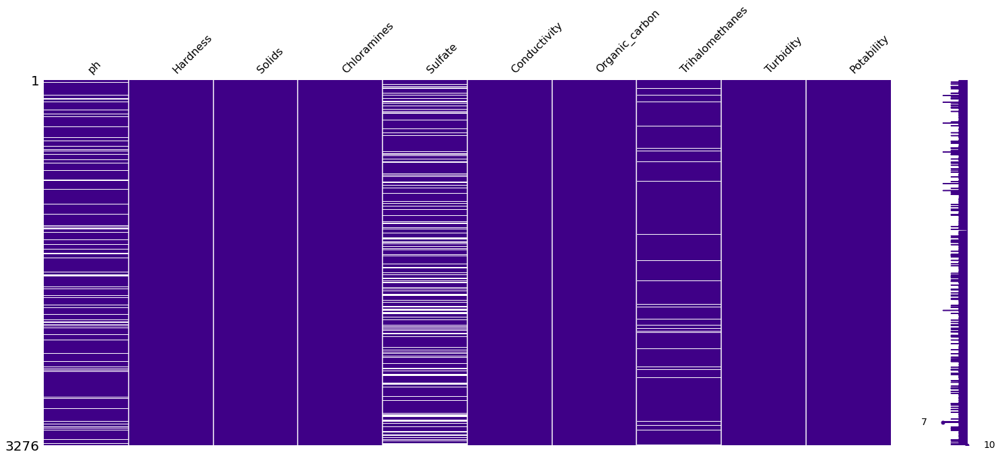

In [27]:
msno.matrix(df, color=(0.25, 0.00, 0.53))

<AxesSubplot:title={'center':'Missing Values Per Feature'}>

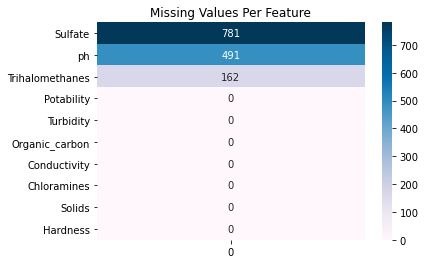

In [28]:
plt.title('Missing Values Per Feature')
nans = df.isna().sum().sort_values(ascending=False).to_frame()
sns.heatmap(nans,annot=True,fmt='d',cmap='PuBu')

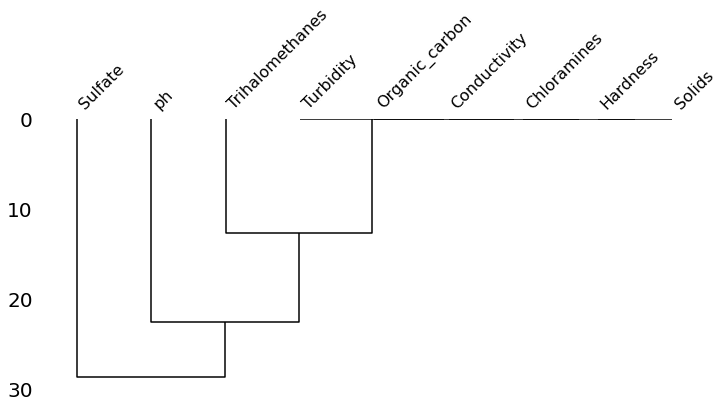

In [29]:
msno.dendrogram(data,figsize=(12,5)) #Missing Relationship
plt.show()

### Missing Imputation:

In [215]:
df = df.drop_duplicates()

In [216]:
Not_Potable =df[df.Potability==0]

In [217]:
Potable=df[df.Potability==1]

In [218]:
Potable.fillna(Potable.median(), inplace=True)
Not_Potable.fillna(Not_Potable.median(), inplace=True)

In [219]:
df=pd.concat([Potable, Not_Potable], axis=0)
df = df.iloc[np.random.permutation(len(df))]
df=df.reset_index(drop=True)
df.head()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
0,9.186453,169.119805,27055.696261,7.442480,331.838167,498.635322,10.247444,50.401160,3.453861,1
1,7.035456,171.695022,38971.051010,8.365579,385.953730,397.441713,17.201608,73.646996,2.643212,0
2,7.035456,196.083556,18592.083920,7.245436,321.814033,552.879034,15.664786,81.080826,4.762872,0
3,6.350290,190.383738,14905.393852,5.537830,331.838167,446.840605,13.983567,67.817096,4.265233,1
4,8.309228,198.336900,24344.966693,8.343510,278.866835,456.530019,15.514119,64.444751,3.756397,1


In [220]:
df.nunique()

ph                 2786
Hardness           3276
Solids             3276
Chloramines        3276
Sulfate            2496
Conductivity       3276
Organic_carbon     3276
Trihalomethanes    3114
Turbidity          3276
Potability            2
dtype: int64

In [221]:
round(df.Potability.value_counts()*100/len(df),2)

0    60.99
1    39.01
Name: Potability, dtype: float64

In [222]:
print(df.isnull().sum())

ph                 0
Hardness           0
Solids             0
Chloramines        0
Sulfate            0
Conductivity       0
Organic_carbon     0
Trihalomethanes    0
Turbidity          0
Potability         0
dtype: int64


In [223]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3276 entries, 0 to 3275
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   ph               3276 non-null   float64
 1   Hardness         3276 non-null   float64
 2   Solids           3276 non-null   float64
 3   Chloramines      3276 non-null   float64
 4   Sulfate          3276 non-null   float64
 5   Conductivity     3276 non-null   float64
 6   Organic_carbon   3276 non-null   float64
 7   Trihalomethanes  3276 non-null   float64
 8   Turbidity        3276 non-null   float64
 9   Potability       3276 non-null   int64  
dtypes: float64(9), int64(1)
memory usage: 256.1 KB


In [39]:
df.describe().T.style.background_gradient(subset=['mean','std','50%','count'], cmap='PuBu')

,count,mean,std,min,25%,50%,75%,max
ph,3276.000000,7.074069,1.470043,0.000000,6.277673,7.035456,7.870050,14.000000
Hardness,3276.000000,196.369496,32.879761,47.432000,176.850538,196.967627,216.667456,323.124000
Solids,3276.000000,22014.092526,8768.570828,320.942611,15666.690297,20927.833607,27332.762127,61227.196008
Chloramines,3276.000000,7.122277,1.583085,0.352000,6.127421,7.130299,8.114887,13.127000
Sulfate,3276.000000,333.544928,36.146829,129.000000,317.094638,333.389426,350.385756,481.030642
Conductivity,3276.000000,426.205111,80.824064,181.483754,365.734414,421.884968,481.792304,753.342620
Organic_carbon,3276.000000,14.284970,3.308162,2.200000,12.065801,14.218338,16.557652,28.300000
Trihalomethanes,3276.000000,66.405792,15.769943,0.738000,56.647656,66.542198,76.666609,124.000000
Turbidity,3276.000000,3.966786,0.780382,1.450000,3.439711,3.955028,4.500320,6.739000
Potability,3276.000000,0.390110,0.487849,0.000000,0.000000,0.000000,1.000000,1.000000


In [40]:
df.describe()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
count,3276.000000,3276.000000,3276.000000,3276.000000,3276.000000,3276.000000,3276.000000,3276.000000,3276.000000,3276.000000
mean,7.074069,196.369496,22014.092526,7.122277,333.544928,426.205111,14.284970,66.405792,3.966786,0.390110
std,1.470043,32.879761,8768.570828,1.583085,36.146829,80.824064,3.308162,15.769943,0.780382,0.487849
min,0.000000,47.432000,320.942611,0.352000,129.000000,181.483754,2.200000,0.738000,1.450000,0.000000
25%,6.277673,176.850538,15666.690297,6.127421,317.094638,365.734414,12.065801,56.647656,3.439711,0.000000
50%,7.035456,196.967627,20927.833607,7.130299,333.389426,421.884968,14.218338,66.542198,3.955028,0.000000
75%,7.870050,216.667456,27332.762127,8.114887,350.385756,481.792304,16.557652,76.666609,4.500320,1.000000
max,14.000000,323.124000,61227.196008,13.127000,481.030642,753.342620,28.300000,124.000000,6.739000,1.000000


### Outliers Check:

No big jumps in the data, tho it seems stable.

In [41]:
Factor = LocalOutlierFactor()

In [42]:
Factor.fit_predict(df)

array([1, 1, 1, ..., 1, 1, 1])

In [43]:
Gen_Score = Factor.negative_outlier_factor_

In [44]:
Sorted_Score = np.sort(Gen_Score)

In [45]:
print(Sorted_Score[0:150])

[-3.06676573 -2.61730316 -2.38007819 -2.18213153 -2.12775052 -2.11061749
 -2.08521883 -2.07937367 -2.06427634 -2.05416793 -1.92380716 -1.88160358
 -1.86655563 -1.67644928 -1.66829738 -1.62408261 -1.60794855 -1.56449865
 -1.54863817 -1.50740765 -1.49147535 -1.48313389 -1.48046317 -1.46983752
 -1.46089027 -1.4593199  -1.45208469 -1.45061346 -1.43264491 -1.43249333
 -1.41656498 -1.39484674 -1.3746126  -1.37460213 -1.37275367 -1.36781017
 -1.36762806 -1.36158271 -1.3566892  -1.3500318  -1.34729048 -1.3456178
 -1.34158554 -1.33905998 -1.33756853 -1.33656408 -1.33097629 -1.32546561
 -1.32152376 -1.31914915 -1.31821145 -1.31611909 -1.31569795 -1.31244346
 -1.31009019 -1.30856152 -1.30832873 -1.30332308 -1.30295296 -1.30082981
 -1.29864731 -1.29674447 -1.29364731 -1.29256673 -1.2801687  -1.27839168
 -1.27045383 -1.26965432 -1.26913839 -1.26864151 -1.26712611 -1.26576842
 -1.26524704 -1.26168275 -1.26084361 -1.26007118 -1.25976326 -1.25938738
 -1.24898026 -1.24773934 -1.247175   -1.24584062 -1.

# Data Visualization:

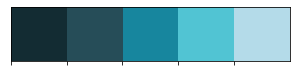

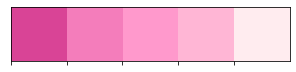

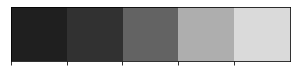

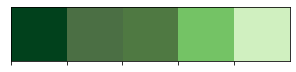

In [49]:
colors_blue = ["#132C33", "#264D58", '#17869E', '#51C4D3', '#B4DBE9']
colors_pink = ["#D94496", "#F47DBB", '#FF99CC', '#FFB6D5', '#ffecef']
colors_dark = ["#1F1F1F", "#313131", '#636363', '#AEAEAE', '#DADADA']
colors_green = ['#01411C','#4B6F44','#4F7942','#74C365','#D0F0C0']
sns.palplot(colors_blue)
sns.palplot(colors_pink)
sns.palplot(colors_dark)
sns.palplot(colors_green)

In [50]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3276 entries, 0 to 3275
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   ph               3276 non-null   float64
 1   Hardness         3276 non-null   float64
 2   Solids           3276 non-null   float64
 3   Chloramines      3276 non-null   float64
 4   Sulfate          3276 non-null   float64
 5   Conductivity     3276 non-null   float64
 6   Organic_carbon   3276 non-null   float64
 7   Trihalomethanes  3276 non-null   float64
 8   Turbidity        3276 non-null   float64
 9   Potability       3276 non-null   int64  
dtypes: float64(9), int64(1)
memory usage: 256.1 KB


In [51]:
d= pd.DataFrame(df['Potability'].value_counts())
fig = px.pie(d,values='Potability',names=['Not Potable','Potable'],hole=0.4,
            color_discrete_sequence=[colors_pink[1],colors_blue[4]],
             labels={'label':'Potability','Potability':'No. Of Samples'})


fig.add_annotation(text='Need to resample the data<br> to get a balanced dataset',
                   x=1.2,y=0.9,showarrow=False,font_size=12,opacity=0.7,font_family='arial')
fig.add_annotation(text='Potability proportion',
                   x=0.5,y=0.5,showarrow=False,font_size=12,opacity=0.7,font_family='arial')

fig.update_layout(
    font_family='arial',
    title=dict(text='Samples of potable water',x=0.47,y=0.98,
               font=dict(color=colors_dark[2],size=20)),
    legend=dict(x=0.37,y=-0.05,orientation='h',traceorder='reversed'),
    hoverlabel=dict(bgcolor='white'))

fig.update_traces(textposition='outside', textinfo='percent+label')

## Feature Exploration:

### <span style='background :#B4DBE9' > Solids (Total dissolved solids - TDS): </span>

<span style='background :#B4DBE9' > - Water has the ability to dissolve a wide range of inorganic and some organic minerals or salts such as potassium, calcium, sodium, bicarbonates, chlorides, magnesium, sulfates etc. These minerals produced un-wanted taste and diluted color in appearance of water. This is the important parameter for the use of water. The water with high TDS value indicates that water is highly mineralized.</span>

<span style='background :#FF99CC' >- Desirable limit for TDS is 500 mg/l and maximum limit is 1000 mg/l which prescribed for drinking purpose.</span>

#### <span style='background :#ffecef' > Observation:The water samples which are above the acceptable limit are more than 98% of the data, which leaves us considering the majority of the potable data already unpotable, and this is one of our business problems which we are discovering.   </span>

In [52]:
fig = px.histogram(df,x='Solids',y=Counter(df['Solids']),color='Potability',template='plotly_white',
                  marginal='violin',opacity=0.7,nbins=100,color_discrete_sequence=[colors_pink[0],colors_blue[3]],
                  barmode='relative',histfunc='count',histnorm='density')

fig.add_vline(x=1200,line_width=2, line_color=colors_dark[1],line_dash='dot',opacity=0.7)
fig.add_annotation(text='Recommended values',x=0.1,y=0.1,showarrow=False,font_size=12)


fig.update_layout(
    font_family='monospace',
    title=dict(text='Solids Distribution',
               font=dict(color=colors_dark[2],size=22)),
    xaxis_title_text='Solids (mg/L)',
    yaxis_title_text='Count',
    legend=dict(x=1,y=0.96,bordercolor=colors_dark[4],borderwidth=0,tracegroupgap=5),
    bargap=0.3,
)
fig.show()

### <span style='background :#B4DBE9' > Chloramines: </span>

<span style='background :#B4DBE9' > - Chlorine and chloramine are the major disinfectants used in public water systems. Chloramines are most commonly formed when ammonia is added to chlorine to treat drinking water. </span>

<span style='background :#FF99CC' >- Chlorine levels up to 4 milligrams per liter (mg/L or 4 parts per million (ppm)) are considered safe in drinking water.</span>

#### <span style='background :#ffecef' > Observation: The potable water samples with high level of Chloramines are more than 97% of the data, which again leaves us considering the majority of the potable data already unpotable, and this is one of our business problems which we are discovering.   </span>

In [53]:
fig = px.histogram(df,x='Chloramines',y=Counter(df['Chloramines']),color='Potability', template='plotly_white',
                  marginal='violin',opacity=0.7,nbins=100,color_discrete_sequence=[colors_pink[0],colors_blue[3]],
                  barmode='relative',histfunc='count',histnorm='density')

fig.add_vline(x=4, line_width=2, line_color=colors_dark[1],line_dash='dot',opacity=0.7)

fig.add_annotation(text='Standard water (<4 ppm is <br> safe for drinking)',x=2,y=350,showarrow=False,font_size=12)


fig.update_layout(
    font_family='monospace',
    title=dict(text='Chloramines Distribution',
               font=dict(color=colors_dark[2],size=22)),
    xaxis_title_text='Chloramines (mg/L)',
    yaxis_title_text='Count',
    legend=dict(x=1,y=0.96,bordercolor=colors_dark[4],borderwidth=0,tracegroupgap=5),
    bargap=0.3,
)
fig.show()

### <span style='background :#B4DBE9' > Sulfates: </span>

<span style='background :#B4DBE9' > - Sulfates are naturally occurring substances that are found in minerals, soil, and rocks. They are present in ambient air, groundwater, plants, and food. The principal commercial use of sulfate is in the chemical industry. Sulfate concentration in seawater is about 2,700 milligrams per liter (mg/L). It ranges from 3 to 30 mg/L in most freshwater supplies, although much higher concentrations (1000 mg/L) are found in some geographic locations. </span>

<span style='background :#FF99CC' >- WHO: It is generally considered that taste impairment is minimal at levels below 250 mg/l. No health-based guideline value has been derived for sulfate.</span>

#### <span style='background :#ffecef' > Observation: Only about 1.8% of the water samples were safe in terms of Sulfate levels. Which again leaves us considering the majority of the potable data already unpotable, and this is one of our business problems which we are discovering.  </span>

In [54]:
fig = px.histogram(df_visual,x='Sulfate',y=Counter(df_visual['Sulfate']),color='Potability', template='plotly_white',
                  marginal='violin',opacity=0.7,nbins=100,color_discrete_sequence=[colors_pink[0],colors_blue[3]],
                  barmode='relative',histfunc='count',histnorm='density')

fig.add_vline(x=190, line_width=1, line_color=colors_dark[1],line_dash='dot',opacity=0.7)

fig.add_annotation(text=' Standard water (<250 mg/L <br> is safe for drinking) ',x=250,y=25,showarrow=False,font_size=12)


fig.update_layout(
    font_family='monospace',
    title=dict(text='Sulfate Distribution',
               font=dict(color=colors_dark[2],size=22)),
    xaxis_title_text='Sulfate (mg/L)',
    yaxis_title_text='Count',
    legend=dict(x=1,y=0.96,bordercolor=colors_dark[4],borderwidth=0,tracegroupgap=5),
    bargap=0.3,
)
fig.show()

### <span style='background :#B4DBE9' > Total Organic Carbon (TOC): </span>

<span style='background :#B4DBE9' > - Total Organic Carbon (TOC) in source waters comes from decaying natural organic matter (NOM) as well as synthetic sources. TOC is a measure of the total amount of carbon in organic compounds in pure water.  </span>

<span style='background :#FF99CC' >-According to US EPA < 2 mg/L as TOC in treated / drinking water, and < 4 mg/Lit in source water which is use for treatment. </span>

#### <span style='background :#ffecef' > Observation: Some Samples (above 65%) of the data classifed as potable while they are under the US EPA standards for potable water.  </span>

In [55]:
fig = px.histogram(df,x='Organic_carbon',y=Counter(df['Organic_carbon']),color='Potability', template='plotly_white',
                  marginal='violin',opacity=0.7,nbins=100,color_discrete_sequence=[colors_pink[0],colors_blue[3]],
                  barmode='relative',histfunc='count',histnorm='density')

fig.add_vline(x=10, line_width=2, line_color=colors_dark[1],line_dash='dot',opacity=0.7)

fig.add_annotation(text='Standard water (TOC<br> level is upto 10 ppm)',x=20,y=350,showarrow=False,font_size=12)


fig.update_layout(
    font_family='monospace',
    title=dict(text='Organic carbon Distribution',
               font=dict(color=colors_dark[2],size=22)),
    xaxis_title_text='Organic carbon (mg/L)',
    yaxis_title_text='Count',
    legend=dict(x=1,y=0.96,bordercolor=colors_dark[4],borderwidth=0,tracegroupgap=5),
    bargap=0.3,
)
fig.show()

### <span style='background :#B4DBE9' > Trihalomethanes: </span>

<span style='background :#B4DBE9' > - THMs are chemicals which may be found in water treated with chlorine. The concentration of THMs in drinking water varies according to the level of organic material in the water, the amount of chlorine required to treat the water, and the temperature of the water that is being treated.  </span>

<span style='background :#FF99CC' >-THM levels up to 80 ppm is considered safe in drinking water. </span>

#### <span style='background :#ffecef' > Observation: Some Samples (about 20% of the data) classifed as potable while they exceeded the 80 ppm levels of potable water.  </span>

In [56]:
fig = px.histogram(df_visual,x='Trihalomethanes',y=Counter(df_visual['Trihalomethanes']),color='Potability', template='plotly_white',
                  marginal='violin',opacity=0.7,nbins=100,color_discrete_sequence=[colors_pink[0],colors_blue[3]],
                  barmode='relative',histfunc='count',histnorm='density')

fig.add_vline(x=80, line_width=2, line_color=colors_dark[1],line_dash='dot',opacity=0.7)

fig.add_annotation(text='Stardand water <br>(Upper limit of Trihalomethanes<br> level is 80 μg/L)',x=20,y=50,showarrow=False,font_size=12)
#fig.add_annotation(text='pH >7 basic solution',x=11,y=350,showarrow=False,font_size=12)


fig.update_layout(
    font_family='monospace',
    title=dict(text='Trihalomethanes Distribution',
               font=dict(color=colors_dark[2],size=22)),
    xaxis_title_text='Trihalomethanes (mg/L)',
    yaxis_title_text='Count',
    legend=dict(x=1,y=0.96,bordercolor=colors_dark[4],borderwidth=0,tracegroupgap=5),
    bargap=0.3,
)
fig.show()

### <span style='background :#B4DBE9' > Turbidity: </span>

<span style='background :#B4DBE9' > - The turbidity of water depends on the quantity of solid matter present in the suspended state. It is a measure of light emitting properties of water and the test is used to indicate the quality of waste discharge with respect to colloidal matter.The mean turbidity value obtained for Wondo Genet Campus (0.98 NTU) is lower than the WHO recommended value of 5.00 NTU. </span>

<span style='background :#FF99CC' > - WHO:recommended value below 5.00 NTU, ideally below 1 NTU</span>

#### <span style='background :#ffecef' > Observation: Some Samples (about 10% of the data) classifed as potable while they exceeded the 5.00 NTU levels of potable water.  </span>

In [57]:
fig = px.histogram(df,x='Turbidity',y=Counter(df['Turbidity']),color='Potability', template='plotly_white',
                  marginal='violin',opacity=0.7,nbins=100,color_discrete_sequence=[colors_pink[0],colors_blue[3]],
                  barmode='relative',histfunc='count',histnorm='density')

fig.add_vline(x=5, line_width=2, line_color=colors_dark[1],line_dash='dot',opacity=0.7)

fig.add_annotation(text=' Stardard water <br>(<5 NTU Turbidity is<br> considered safe) ',x=2,y=1350,showarrow=False,font_size=12)
#fig.add_annotation(text='pH >7 basic solution',x=11,y=350,showarrow=False,font_size=12)


fig.update_layout(
    font_family='monospace',
    title=dict(text='Turbidity Distribution',
               font=dict(color=colors_dark[2],size=22)),
    xaxis_title_text='Turbidity (mg/L)',
    yaxis_title_text='Count',
    legend=dict(x=1,y=0.96,bordercolor=colors_dark[4],borderwidth=0,tracegroupgap=5),
    bargap=0.3,
)
fig.show()

### <span style='background :#B4DBE9' > pH Value: </span>

<span style='background :#B4DBE9' > - PH is an important parameter in evaluating the acid–base balance of water. It is also the indicator of acidic or alkaline condition of water status. </span>

<span style='background :#FF99CC' > - WHO has recommended maximum permissible limit of pH from 6.5 to 8.5. The current investigation ranges were 6.52–6.83 which are in the range of WHO standards.</span>

#### <span style='background :#ffecef' > Observation: Some Samples are outside the recommended limits, which may contain many harmful metals which is in the end against the potability of the water. </span>

In [58]:
fig = px.histogram(df_visual,x='ph',y=Counter(df_visual['ph']),color='Potability', template='plotly_white',
                  marginal='violin',opacity=0.7,nbins=100,color_discrete_sequence=[colors_green[0],colors_dark[3]],
                  barmode='relative',histfunc='count',histnorm='density')

fig.add_vline(x=6.5, line_width=2, line_color=colors_dark[1],line_dash='dot',opacity=0.7)
fig.add_vline(x=8.5, line_width=2, line_color=colors_dark[1],line_dash='dot',opacity=0.7)
fig.add_annotation(text='<7 is Acidic',x=3,y=400,showarrow=False,font_size=10)
fig.add_annotation(text='>7 is Basic',x=11,y=400,showarrow=False,font_size=10)
fig.add_annotation(text='Recommended values',x=7.5,y=950,showarrow=False,font_size=12)


fig.update_layout(
    font_family='monospace',
    title=dict(text='pH Distribution',
               font=dict(color=colors_dark[2],size=22)),
    xaxis_title_text='Hardness (mg/L)',
    yaxis_title_text='Count',
    legend=dict(x=1,y=0.96,bordercolor=colors_dark[4],borderwidth=0,tracegroupgap=5),
    bargap=0.3,
)
fig.show()

### <span style='background :#B4DBE9' > Conductivity: </span>

<span style='background :#B4DBE9' > - Pure water is not a good conductor of electric current rather’s a good insulator. Increase in ions concentration enhances the electrical conductivity of water. Generally, the amount of dissolved solids in water determines the electrical conductivity. Electrical conductivity (EC) actually measures the ionic process of a solution that enables it to transmit current. </span>

<span style='background :#FF99CC' > -  According to WHO standards, EC value should not exceeded 400 μS/cm.</span>

#### <span style='background :#ffecef' > Observation: Almost half of the Samples exceeded 400 μS/cm. and still classifies as potable. </span>

In [59]:
fig = px.histogram(df,x='Conductivity',y=Counter(df['Conductivity']),color='Potability',template='plotly_white',
                  marginal='violin',opacity=0.7,nbins=100,color_discrete_sequence=[colors_green[0],colors_dark[3]],
                  barmode='relative',histfunc='count',histnorm='density')

fig.add_vline(x=0, line_width=2, line_color=colors_dark[1],line_dash='dot',opacity=0.7)
fig.add_vline(x=400, line_width=2, line_color=colors_dark[1],line_dash='dot',opacity=0.7)


fig.add_annotation(text='Standard water <br>(>400 is considered safe)',x=175,y=10,showarrow=False,font_size=12)




fig.update_layout(
    font_family='monospace',
    title=dict(text='Conductivity Distribution',
               font=dict(color=colors_dark[2],size=22)),
    xaxis_title_text='Conductivity (μS/cm)',
    yaxis_title_text='Count',
    legend=dict(x=1,y=0.96,bordercolor=colors_dark[4],borderwidth=0,tracegroupgap=5),
    bargap=0.3,
)
fig.show()

### <span style='background :#B4DBE9' > Hardness: </span>

<span style='background :#B4DBE9' > - Hardness is mainly caused by calcium and magnesium salts. These salts are dissolved from geologic deposits through which water travels. The length of time water is in contact with hardness producing material helps determine how much hardness there is in raw water. Hardness was originally defined as the capacity of water to precipitate soap caused by Calcium and Magnesium. </span>

<span style='background :#FF99CC' > -In some instances, consumers tolerate water hardness in excess of 500 mg/l.</span>

#### <span style='background :#ffecef' > Observation: All of the data samples are in the acceptable range.  </span>

In [60]:
fig = px.histogram(df,x='Hardness',y=Counter(df['Hardness']),color='Potability',template='plotly_white',
                  marginal='violin',opacity=0.7,nbins=100,color_discrete_sequence=[colors_green[0],colors_dark[3]],
                  barmode='relative',histfunc='count',histnorm='density')

fig.add_vline(x=151, line_width=1, line_color=colors_dark[1],line_dash='dot',opacity=0.7)
fig.add_vline(x=301, line_width=1, line_color=colors_dark[1],line_dash='dot',opacity=0.7)
fig.add_vline(x=76, line_width=1, line_color=colors_dark[1],line_dash='dot',opacity=0.7)

fig.add_annotation(text='<60 mg/L is<br> soft',x=40,y=50,showarrow=False,font_size=12)
fig.add_annotation(text='Between 76 and<br> 150 (mg/L) is<br>moderately hard',x=113,y=50,showarrow=False,font_size=12)
fig.add_annotation(text='Between 151 and 300 (mg/L)<br> hard',x=230,y=50,showarrow=False,font_size=12)
fig.add_annotation(text='>300 mg/L is<br> very hard',x=340,y=50,showarrow=False,font_size=12)

fig.update_layout(
    font_family='monospace',
    title=dict(text='Hardness Distribution',
               font=dict(color=colors_dark[2],size=22)),
    xaxis_title_text='Hardness (mg/L)',
    yaxis_title_text='Count',
    legend=dict(x=1,y=0.96,bordercolor=colors_dark[4],borderwidth=0,tracegroupgap=5),
    bargap=0.3,
)
fig.show()

## Correlation: 
##### <span style='background :#ffecef' > Observation: - No linear relationship between the features because we have binary label and continuous features. So, Linear model may not work on this case.<span>

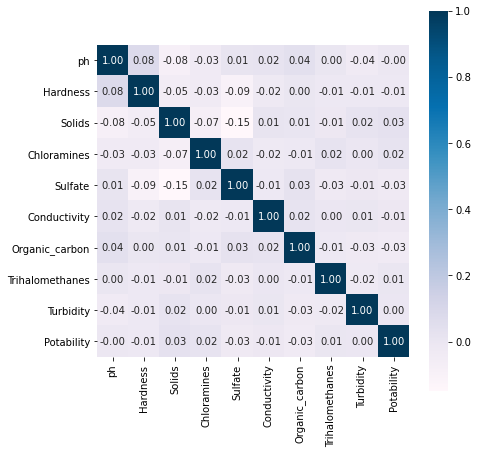

In [61]:
Corrmat = df.corr()
plt.subplots(figsize=(7,7))
sns.heatmap(Corrmat, cmap="PuBu", square = True, annot=True, fmt='.2f')
plt.show()

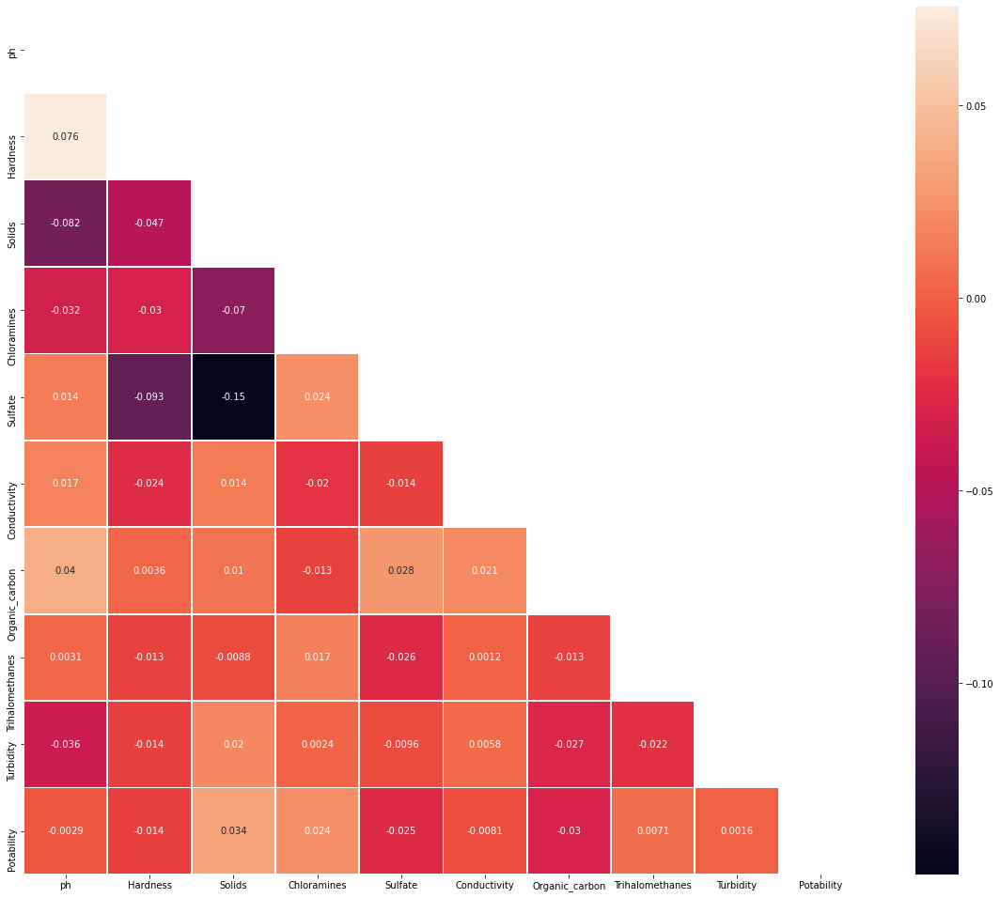

In [62]:
plt.figure(figsize=(20, 17))
matrix = np.triu(df.corr())
sns.heatmap(df.corr(), annot=True,linewidth=.8, mask=matrix, cmap="rocket");

## Boxplot and Distribution:
##### <span style='background :#ffecef' > Observation: </span>
##### <span style='background :#ffecef' >- The Boxplot and density distribution of different features by Potability show that the difference in mean values aren't big. </span>
#### <span style='background :#ffecef' > - There are some differences in the feature distribution among the potability, so we could get use of these differences while modelling. (ex: SUlfate, hardness, and chloramines have big impact on the water health).</span>

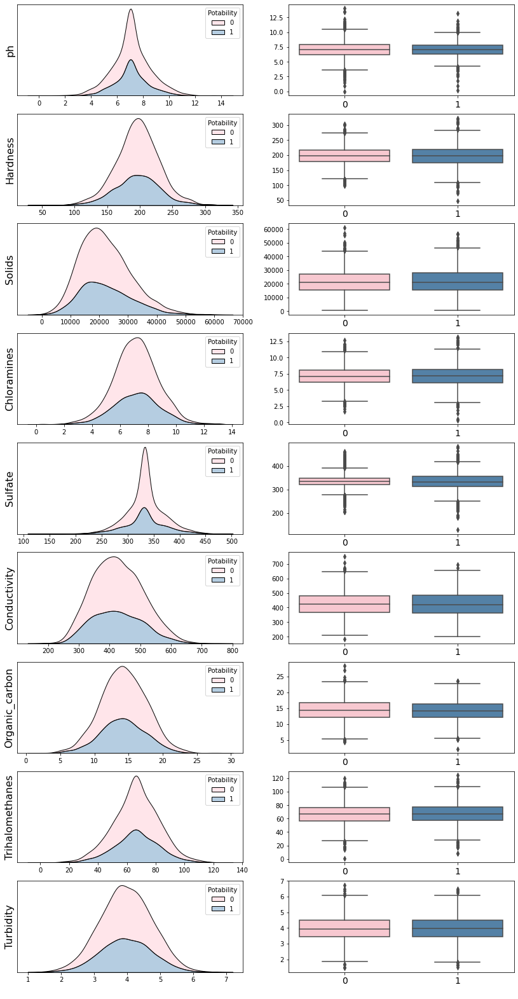

In [63]:
fig, ax = plt.subplots(ncols=2, nrows=9, figsize=(14, 28))

features = list(df.columns.drop('Potability'))
i=0
for cols in features:
    sns.kdeplot(df[cols], fill=True, alpha=0.4, hue = df.Potability, 
                palette=('pink', 'steelblue'), multiple='stack', ax=ax[i,0])
    
    sns.boxplot(data= df, y=cols, x='Potability', ax=ax[i, 1],
               palette=('pink', 'steelblue'))
    ax[i,0].set_xlabel(' ')
    ax[i,1].set_xlabel(' ')
    ax[i,1].set_ylabel(' ')
    ax[i,1].xaxis.set_tick_params(labelsize=14)
    ax[i,0].tick_params(left=False, labelleft=False)
    ax[i,0].set_ylabel(cols, fontsize=16)
    i=i+1
      
plt.show()

In [64]:
df.columns

Index(['ph', 'Hardness', 'Solids', 'Chloramines', 'Sulfate', 'Conductivity',
       'Organic_carbon', 'Trihalomethanes', 'Turbidity', 'Potability'],
      dtype='object')

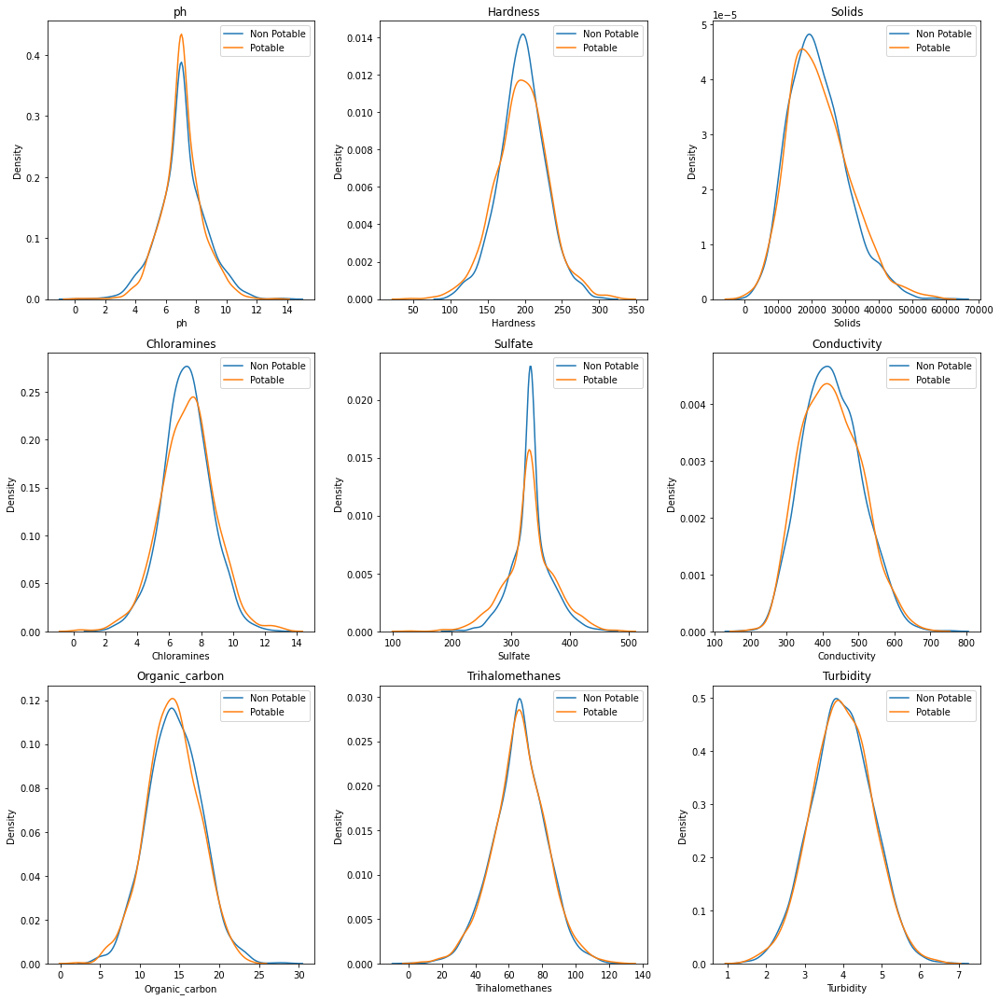

In [65]:
non_potable = df.query("Potability == 0")
potable = df.query("Potability == 1")

plt.figure(figsize = (15,15))
for ax, col in enumerate(df.columns[:9]):
    plt.subplot(3,3, ax + 1)
    plt.title(col)
    sns.kdeplot(x = non_potable[col], label = "Non Potable")
    sns.kdeplot(x = potable[col], label = "Potable")
    plt.legend()
plt.tight_layout()

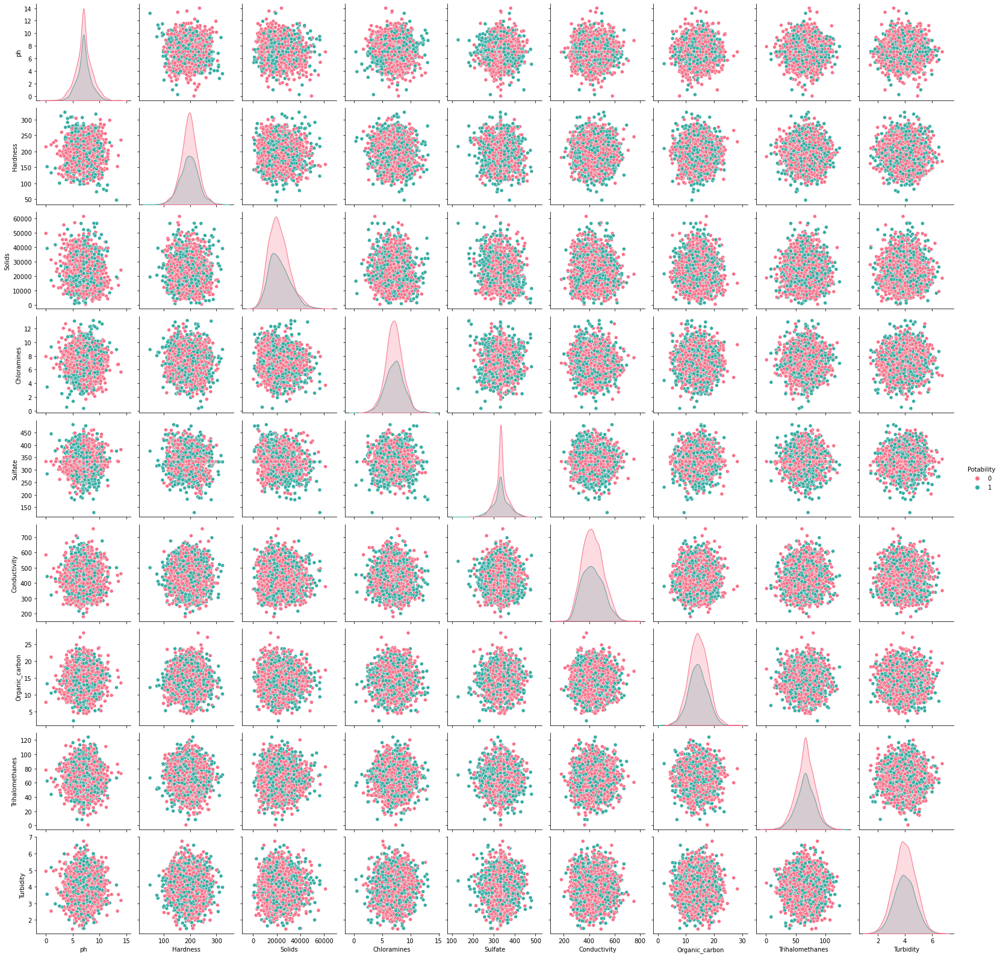

In [66]:
sns.pairplot(df, hue="Potability", palette="husl");

# Fixing the Global Standards

In [224]:
Num = df.select_dtypes(include=["float32","float64","int32","int64"])

In [225]:
pH_Min = Num[Num["ph"] < 6.5]
pH_Max = Num[Num["ph"] > 8.5]

pH_Min = pH_Min.reset_index(drop=True)
pH_Max = pH_Max.reset_index(drop=True)

In [226]:
Chloramines_Min = Num[Num["Chloramines"] < 4.0]
Chloramines_Max = Num[Num["Chloramines"] > 5.0]

Chloramines_Min = Chloramines_Min.reset_index(drop=True)
Chloramines_Max = Chloramines_Max.reset_index(drop=True)

In [154]:
#Num.loc[Num.Conductivity > 400, 'Potability'] = 0

In [227]:
Solids_Min = Num[Num["Solids"] < 500]
Solids_Max = Num[Num["Solids"] > 1000]

Solids_Min = Solids_Min.reset_index(drop=True)
Solids_Max = Solids_Max.reset_index(drop=True)

In [228]:
Trihalomethanes_Limit = Num[Num["Trihalomethanes"] > 80]

Trihalomethanes_Limit = Trihalomethanes_Limit.reset_index(drop=True)

In [229]:
Conductivity_Limit = Num[Num["Conductivity"] > 400.0]

Conductivity_Limit = Conductivity_Limit.reset_index(drop=True)

In [230]:
Turbidity_Limit = Num[Num["Turbidity"] < 5.0]

Turbidity_Limit = Turbidity_Limit.reset_index(drop=True)

In [231]:
print(Num.groupby(["Potability"])["ph"].mean())

Potability
0    7.077533
1    7.068655
Name: ph, dtype: float64


In [76]:
print(Num.groupby(["Potability"])["Solids"].mean())

Potability
0    21777.490788
1    22383.991018
Name: Solids, dtype: float64


In [77]:
print(Num.groupby(["Potability"])["Chloramines"].mean())

Potability
0    7.092175
1    7.169338
Name: Chloramines, dtype: float64


In [78]:
print(Num.groupby(["Potability"])["Sulfate"].mean())

Potability
0    334.277336
1    332.399897
Name: Sulfate, dtype: float64


In [79]:
print(Num.groupby(["Potability"])["Conductivity"].mean())

Potability
0    426.730454
1    425.383800
Name: Conductivity, dtype: float64


In [80]:
print(Num.groupby(["Potability"])["Trihalomethanes"].mean())

Potability
0    66.316335
1    66.545646
Name: Trihalomethanes, dtype: float64


In [81]:
print(Num.groupby(["Potability"])["Organic_carbon"].mean())

Potability
0    14.364335
1    14.160893
Name: Organic_carbon, dtype: float64


In [82]:
print(Num.groupby(["Potability"])["Hardness"].mean())

Potability
0    196.733292
1    195.800744
Name: Hardness, dtype: float64



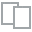
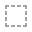
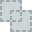
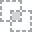
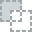
...
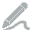
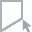
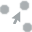
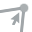
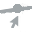

In [83]:
plot_correlation(Num)


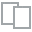
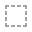
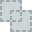
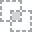
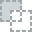
...
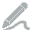
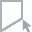
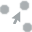
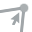
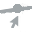

In [83]:
plot(Num)


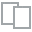
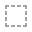
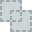
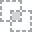
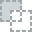
...
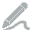
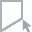
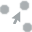
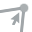
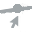

In [84]:
plot(Num, "Potability")


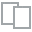
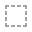
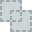
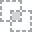
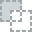
...
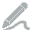
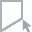
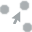
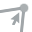
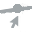

In [85]:
plot(Num, "ph")

## Skewness

In [373]:
from luciferml.supervised.classification import Classification
from luciferml.preprocessing import Preprocess as prep


          
██╗░░░░░██╗░░░██╗░█████╗░██╗███████╗███████╗██████╗░░░░░░░███╗░░░███╗██╗░░░░░
██║░░░░░██║░░░██║██╔══██╗██║██╔════╝██╔════╝██╔══██╗░░░░░░████╗░████║██║░░░░░
██║░░░░░██║░░░██║██║░░╚═╝██║█████╗░░█████╗░░██████╔╝█████╗██╔████╔██║██║░░░░░
██║░░░░░██║░░░██║██║░░██╗██║██╔══╝░░██╔══╝░░██╔══██╗╚════╝██║╚██╔╝██║██║░░░░░
███████╗╚██████╔╝╚█████╔╝██║██║░░░░░███████╗██║░░██║░░░░░░██║░╚═╝░██║███████╗
╚══════╝░╚═════╝░░╚════╝░╚═╝╚═╝░░░░░╚══════╝╚═╝░░╚═╝░░░░░░╚═╝░░░░░╚═╝╚══════╝

Started Preprocessor 


Skewness in numerical features: 

                 Skewness
Conductivity    -0.277978
Turbidity       -0.730482
Sulfate         -0.894808
Hardness        -1.024578
Organic_carbon  -1.108195
Solids          -1.593006
Chloramines     -1.908682
ph              -3.220965
Trihalomethanes -4.283803
Skewness Before Transformation for Conductivity:  -0.27810496 

Mean before Transformation for Conductivity : 1.9511098861694336, Standard Deviation before Transformation for Conductivity : 0.027353998

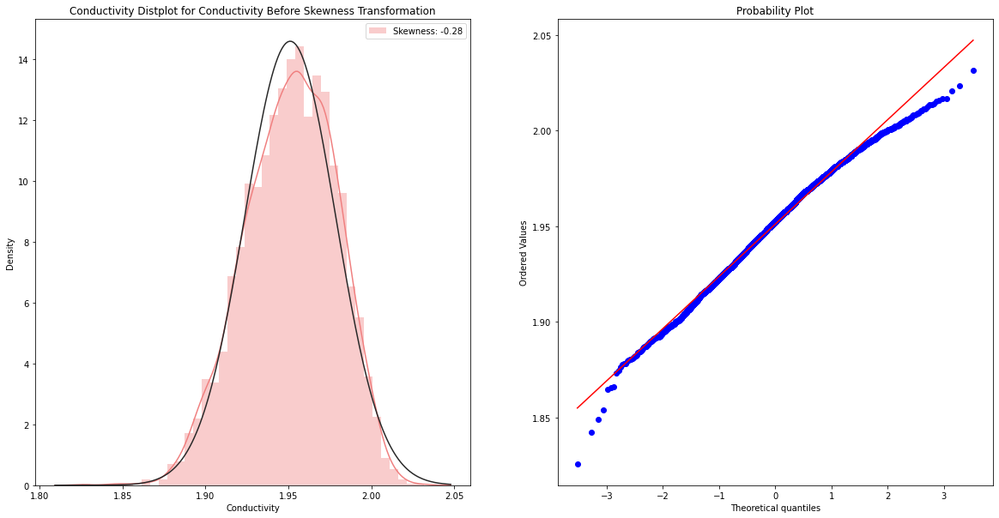

Skewness After Transformation for Conductivity:  -0.30267483 

Mean before Transformation for Conductivity : 1.0821382999420166, Standard Deviation before Transformation for Conductivity : 0.009281928651034832 



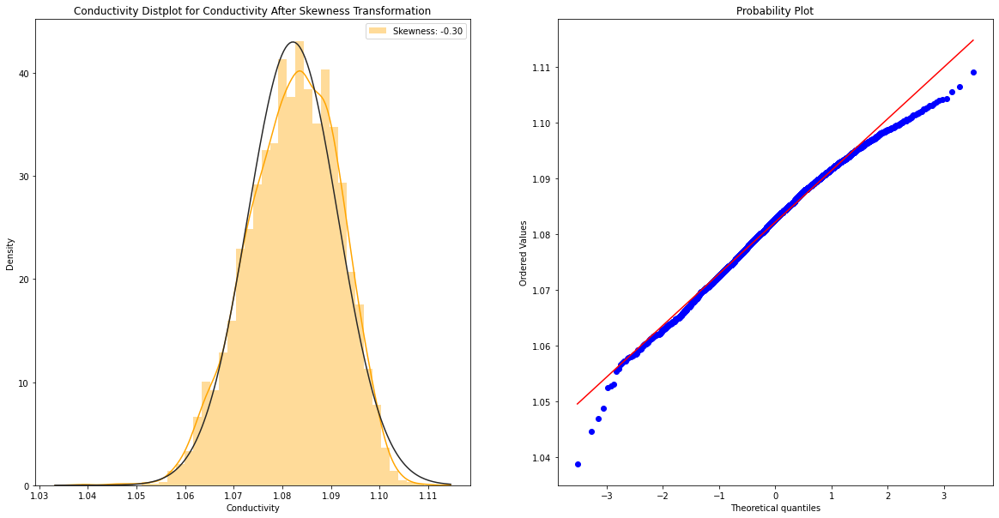

Skewness Before Transformation for Turbidity:  -0.7308191 

Mean before Transformation for Turbidity : 0.9496117830276489, Standard Deviation before Transformation for Turbidity : 0.06407755613327026 



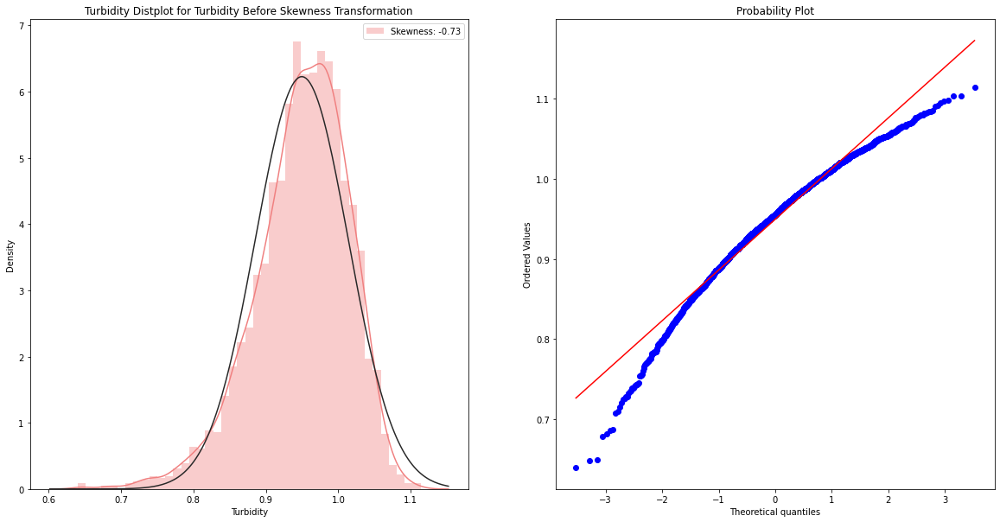

Skewness After Transformation for Turbidity:  -0.85986125 

Mean before Transformation for Turbidity : 0.667080283164978, Standard Deviation before Transformation for Turbidity : 0.033323660492897034 



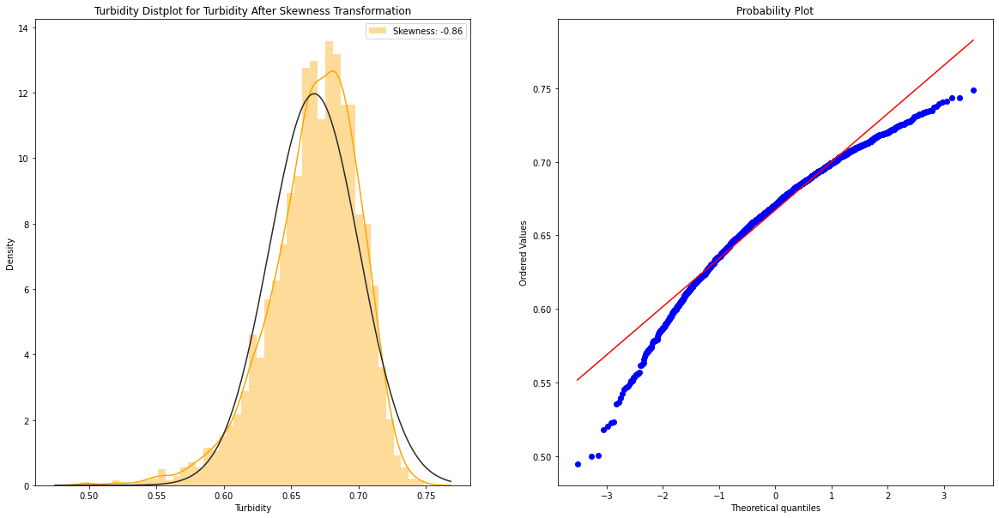

Skewness Before Transformation for Sulfate:  -0.89519614 

Mean before Transformation for Sulfate : 1.9177788496017456, Standard Deviation before Transformation for Sulfate : 0.016450749710202217 



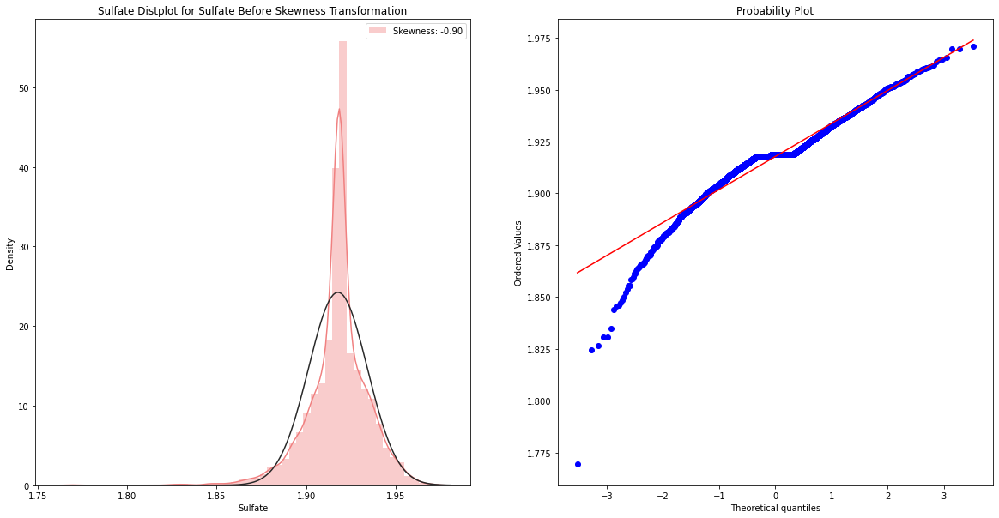

Skewness After Transformation for Sulfate:  -0.944625 

Mean before Transformation for Sulfate : 1.070806622505188, Standard Deviation before Transformation for Sulfate : 0.005652919411659241 



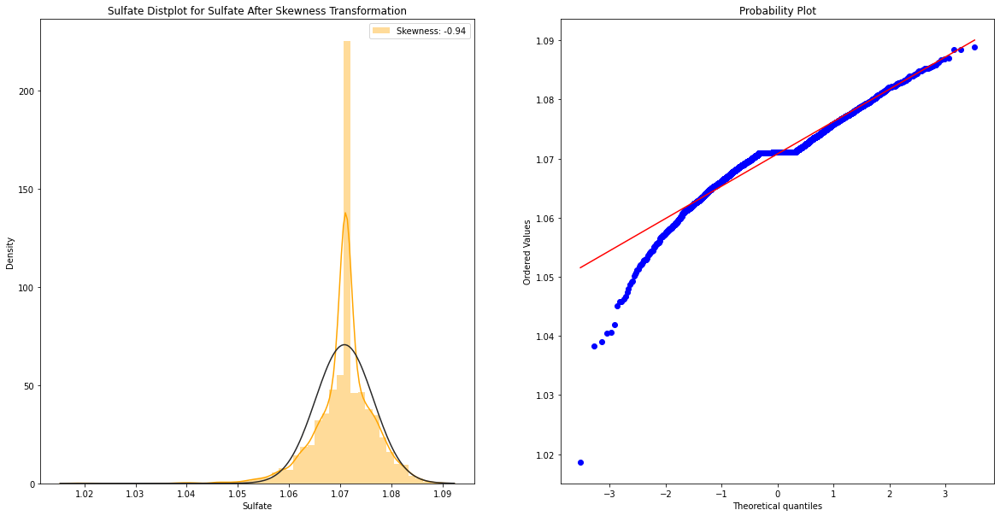

Skewness Before Transformation for Hardness:  -1.0250473 

Mean before Transformation for Hardness : 1.835428237915039, Standard Deviation before Transformation for Hardness : 0.028403883799910545 



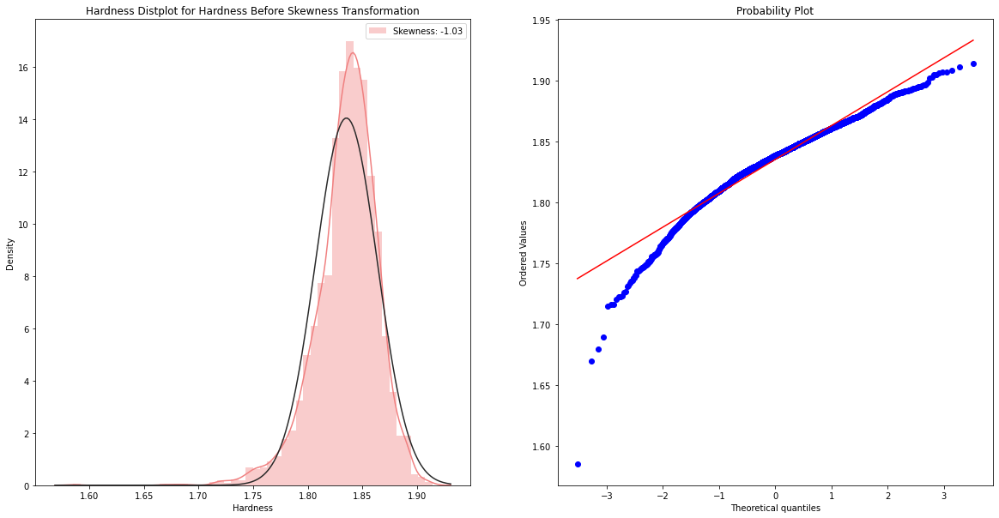

Skewness After Transformation for Hardness:  -1.0957953 

Mean before Transformation for Hardness : 1.042142391204834, Standard Deviation before Transformation for Hardness : 0.010071775875985622 



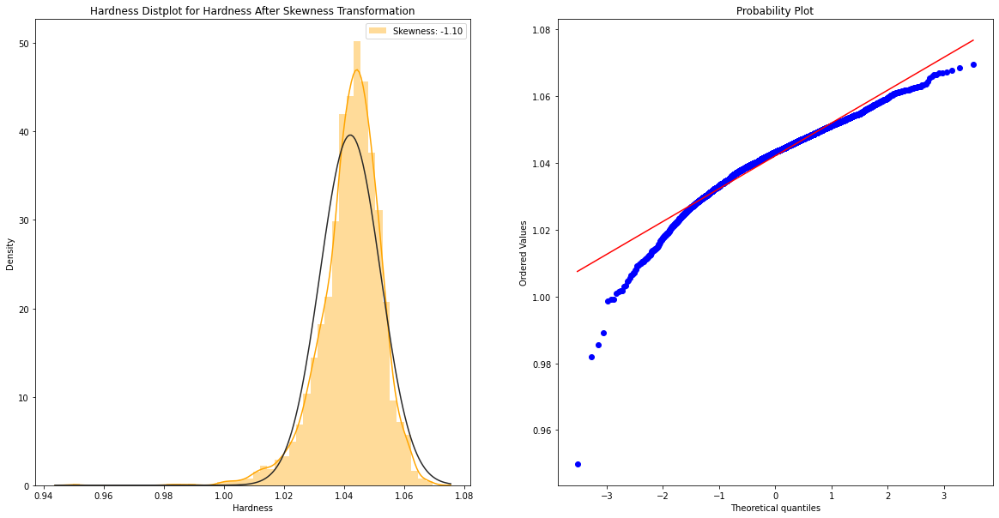

Skewness Before Transformation for Organic_carbon:  -1.1087028 

Mean before Transformation for Organic_carbon : 1.3067208528518677, Standard Deviation before Transformation for Organic_carbon : 0.06456421315670013 



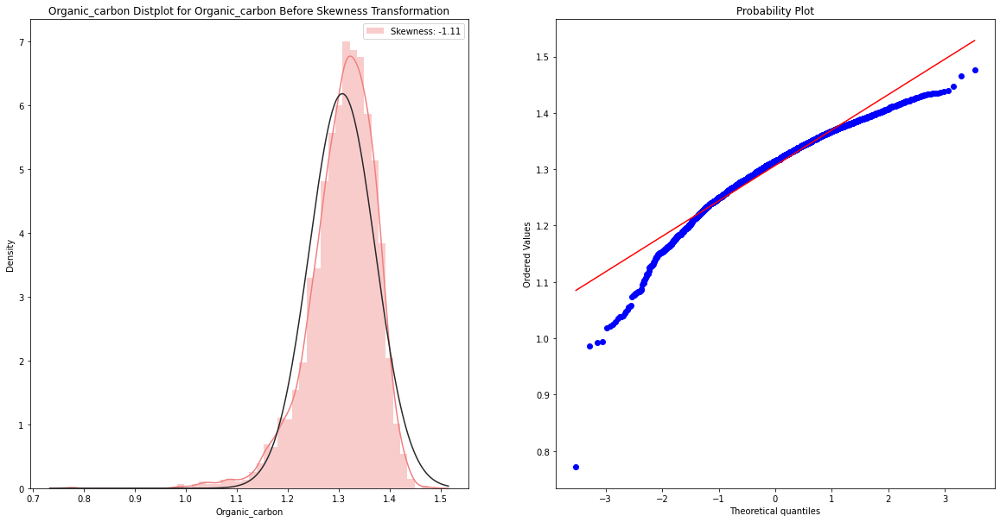

Skewness After Transformation for Organic_carbon:  -1.2904036 

Mean before Transformation for Organic_carbon : 0.8354260921478271, Standard Deviation before Transformation for Organic_carbon : 0.02848481573164463 



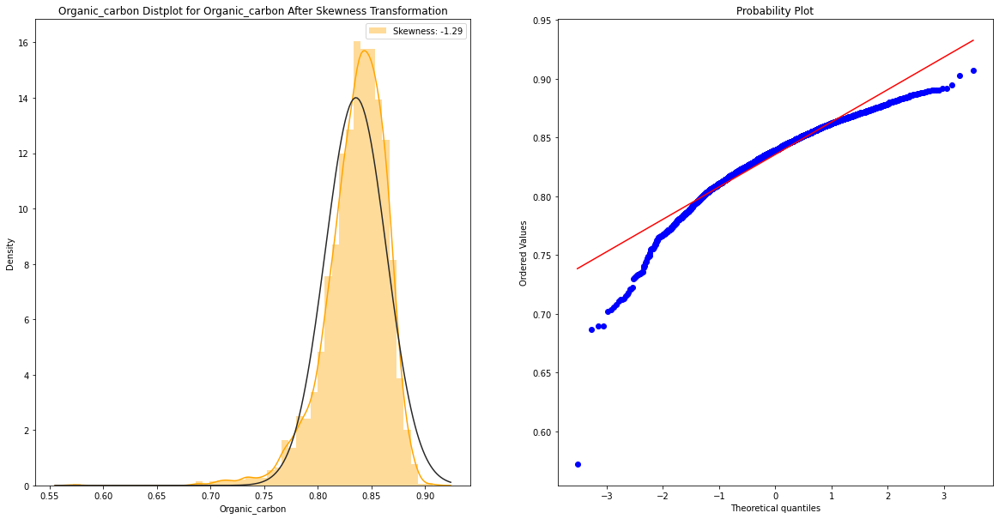

Skewness Before Transformation for Solids:  -1.5937527 

Mean before Transformation for Solids : 2.3889920711517334, Standard Deviation before Transformation for Solids : 0.04204513877630234 



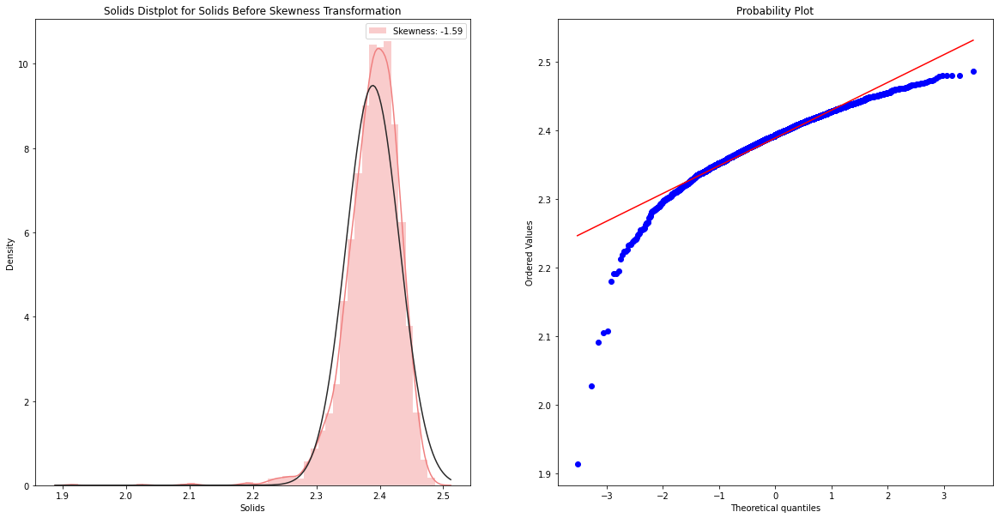

Skewness After Transformation for Solids:  -1.774975 

Mean before Transformation for Solids : 1.220454454421997, Standard Deviation before Transformation for Solids : 0.012539842166006565 



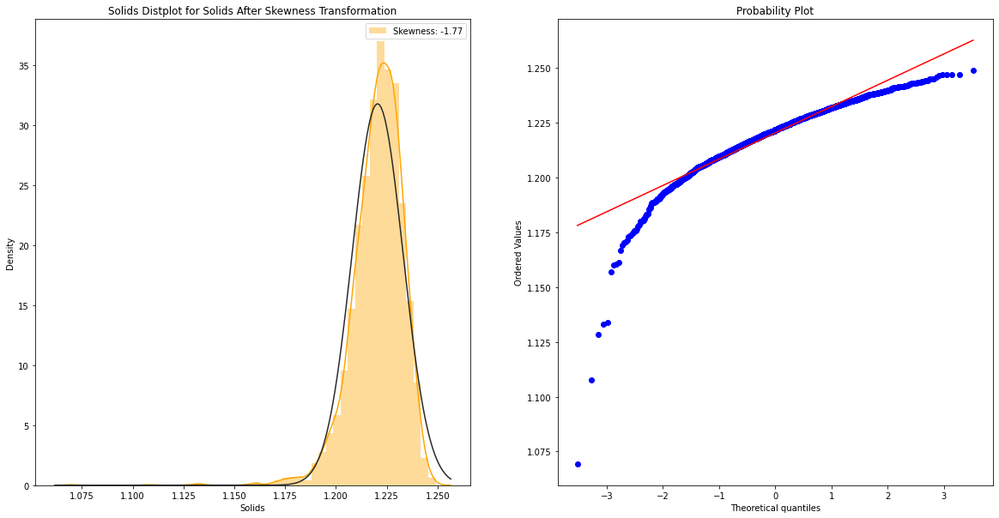

Skewness Before Transformation for Chloramines:  -1.9095566 

Mean before Transformation for Chloramines : 1.1204544305801392, Standard Deviation before Transformation for Chloramines : 0.07230816781520844 



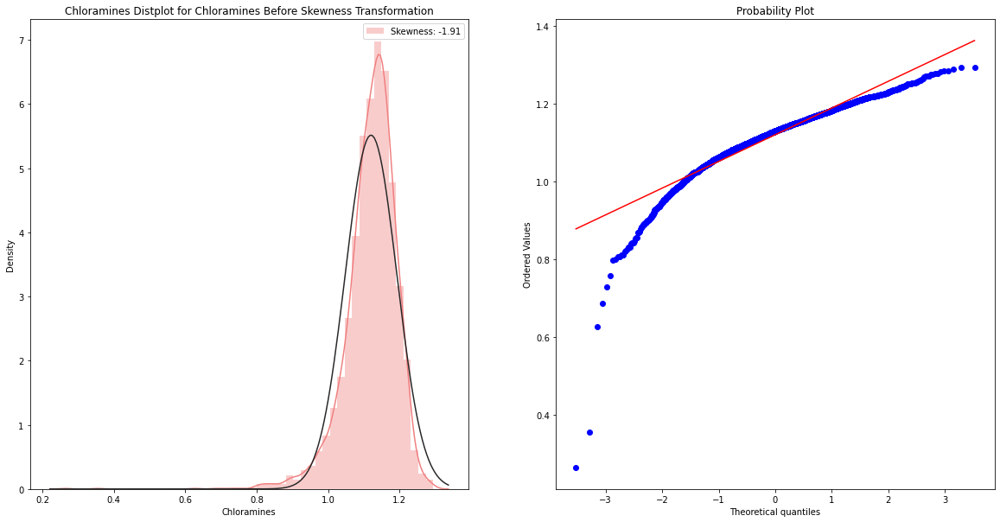

Skewness After Transformation for Chloramines:  -2.705849 

Mean before Transformation for Chloramines : 0.7510167956352234, Standard Deviation before Transformation for Chloramines : 0.035562727600336075 



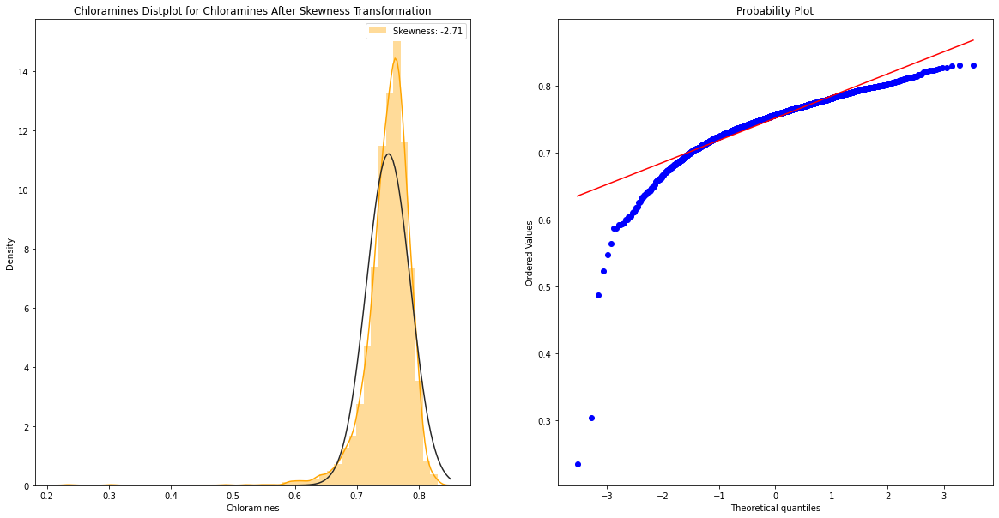

Skewness Before Transformation for ph:  -3.2224407 

Mean before Transformation for Ph : 1.1195502281188965, Standard Deviation before Transformation for Ph : 0.07008704543113708 



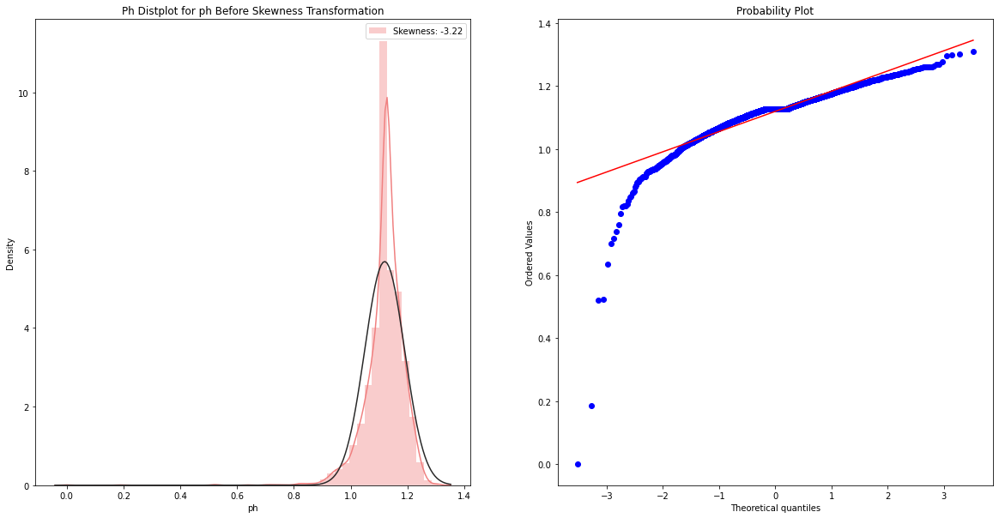

Skewness After Transformation for ph:  -5.4856024 

Mean before Transformation for Ph : 0.7506005167961121, Standard Deviation before Transformation for Ph : 0.035778820514678955 



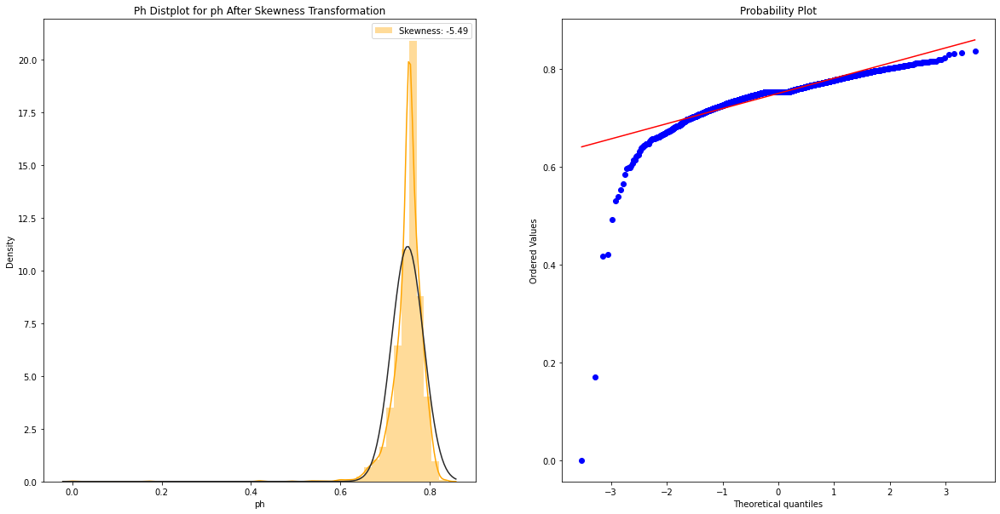

Skewness Before Transformation for Trihalomethanes:  -4.2857594 

Mean before Transformation for Trihalomethanes : 1.643127202987671, Standard Deviation before Transformation for Trihalomethanes : 0.05643909424543381 



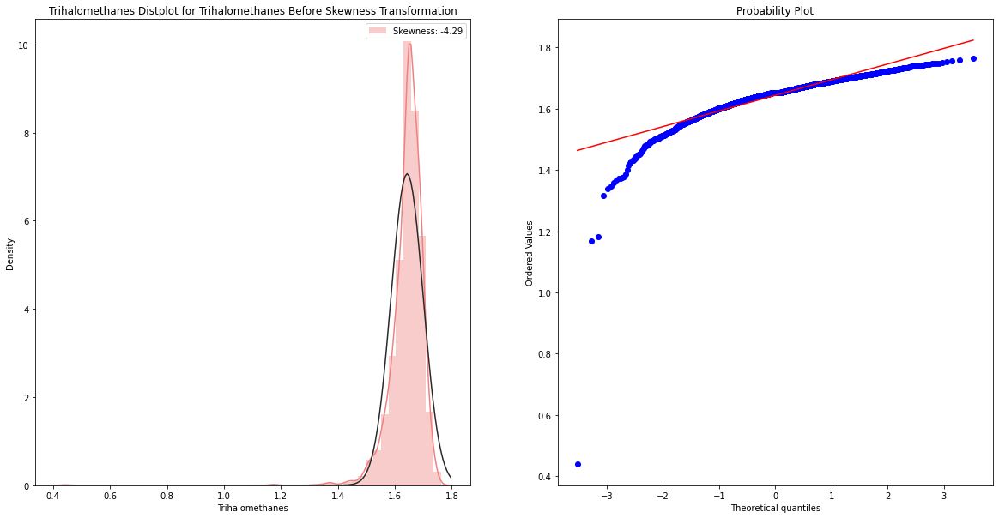

Skewness After Transformation for Trihalomethanes:  -7.0584593 

Mean before Transformation for Trihalomethanes : 0.9717152118682861, Standard Deviation before Transformation for Trihalomethanes : 0.02279788628220558 



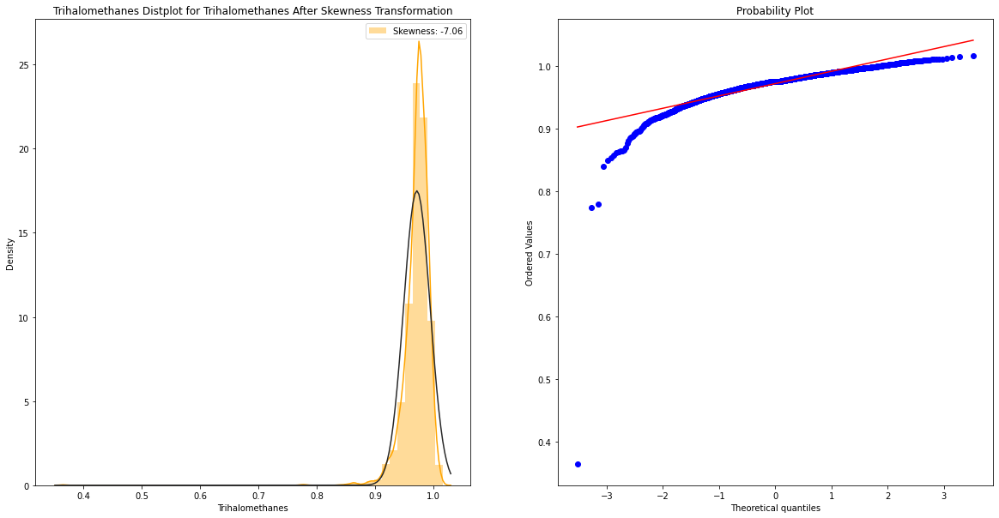

Elapsed Time:  8.28235387802124 seconds



In [374]:
 dataset = prep.skewcorrect(Num,except_columns=['Potability'])

# Choosing the best Model:

In [232]:
data = Num.sample(frac=0.8, random_state=42)
data_unseen = Num.drop(data.index)
data.reset_index(inplace=True, drop=True)
data_unseen.reset_index(inplace=True, drop=True)
print('Data for Modeling: ' + str(data.shape))

Data for Modeling: (2621, 10)


In [233]:
print('Unseen Data For Predictions: ' + str(data_unseen.shape))

Unseen Data For Predictions: (655, 10)


In [234]:
round(data.Potability.value_counts()*100/len(data),2)

0    60.32
1    39.68
Name: Potability, dtype: float64

In [235]:
Num = Num.astype("float32")

In [308]:
best = compare_models()
# return top 3 models based on 'Accuracy'
top3 = compare_models(n_select = 3)
# return best model based on AUC
best = compare_models(sort = 'AUC') #default is 'Accuracy'

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
catboost,CatBoost Classifier,0.7677,0.8715,0.7622,0.6732,0.7140,0.5199,0.5238,0.5760
lightgbm,Light Gradient Boosting Machine,0.7508,0.8564,0.7213,0.6564,0.6870,0.4807,0.4825,0.7140
gbc,Gradient Boosting Classifier,0.7339,0.8550,0.8032,0.6154,0.6964,0.4670,0.4807,0.0880
xgboost,Extreme Gradient Boosting,0.7557,0.8526,0.7201,0.6651,0.6912,0.4896,0.4910,0.3630
rf,Random Forest Classifier,0.7579,0.8524,0.6931,0.6787,0.6851,0.4886,0.4894,0.0940
ada,Ada Boost Classifier,0.7001,0.8067,0.8045,0.5768,0.6712,0.4095,0.4294,0.0350
et,Extra Trees Classifier,0.6854,0.7212,0.4298,0.6263,0.5092,0.2894,0.3008,0.0900
dt,Decision Tree Classifier,0.7085,0.6994,0.6616,0.6074,0.6330,0.3921,0.3933,0.0100
qda,Quadratic Discriminant Analysis,0.6164,0.6726,0.6147,0.4976,0.5492,0.2222,0.2265,0.0070
knn,K Neighbors Classifier,0.5746,0.6021,0.5632,0.4522,0.5012,0.1381,0.1409,0.0150


create_model_container: 45
master_model_container: 45
display_container: 4
compare_models() succesfully completed......................................


In [375]:
features = dataset.iloc[:, :-1]
labels = dataset.iloc[:, -1]

In [376]:
features.shape, labels.shape

((3276, 9), (3276,))

In [377]:
accuracy_scores =  {}

# Logistic regression


          
██╗░░░░░██╗░░░██╗░█████╗░██╗███████╗███████╗██████╗░░░░░░░███╗░░░███╗██╗░░░░░
██║░░░░░██║░░░██║██╔══██╗██║██╔════╝██╔════╝██╔══██╗░░░░░░████╗░████║██║░░░░░
██║░░░░░██║░░░██║██║░░╚═╝██║█████╗░░█████╗░░██████╔╝█████╗██╔████╔██║██║░░░░░
██║░░░░░██║░░░██║██║░░██╗██║██╔══╝░░██╔══╝░░██╔══██╗╚════╝██║╚██╔╝██║██║░░░░░
███████╗╚██████╔╝╚█████╔╝██║██║░░░░░███████╗██║░░██║░░░░░░██║░╚═╝░██║███████╗
╚══════╝░╚═════╝░░╚════╝░╚═╝╚═╝░░░░░╚══════╝╚═╝░░╚═╝░░░░░░╚═╝░░░░░╚═╝╚══════╝

Started LuciferML 

Checking if labels or features are categorical! [*]

Features and labels are not categorical [ ✓ ]

Checking for Categorical Variables Done [ ✓ ]

Checking for Sparse Matrix [*]

Applying SMOTE [*]

SMOTE Done [ ✓ ]

Splitting Data into Train and Validation Sets [*]

Splitting Done [ ✓ ]

Scaling Training and Test Sets [*]

Scaling Done [ ✓ ]

Training Logistic Regression on Training Set [*]

Model Training Done [ ✓ ]

Predicting Data [*]

Data Prediction Done [ ✓ ]

Making Confusion Matrix [*]

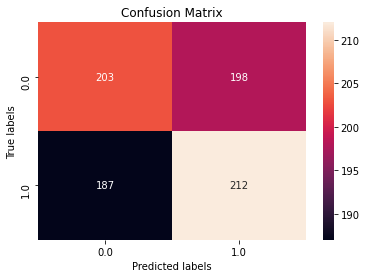

Confusion Matrix Done [ ✓ ]

Evaluating Model Performance [*]
Validation Accuracy is : 0.51875
Evaluating Model Performance [ ✓ ]

Applying K-Fold Cross Validation [*]
Accuracy: 48.97 %
Standard Deviation: 2.39 %
K-Fold Cross Validation [ ✓ ]

Complete [ ✓ ]

Time Elapsed :  0.3795661926269531 seconds 



In [378]:
params = {'C': 0.00026366508987303583, 'penalty': 'l2', 'solver': 'newton-cg'}

classifier =  Classification(predictor = 'lr',params=params, smote = 'y')
classifier.fit(features, labels)
result = classifier.result()
accuracy_scores[result['Classifier']] = result['Accuracy']

# KNN


          
██╗░░░░░██╗░░░██╗░█████╗░██╗███████╗███████╗██████╗░░░░░░░███╗░░░███╗██╗░░░░░
██║░░░░░██║░░░██║██╔══██╗██║██╔════╝██╔════╝██╔══██╗░░░░░░████╗░████║██║░░░░░
██║░░░░░██║░░░██║██║░░╚═╝██║█████╗░░█████╗░░██████╔╝█████╗██╔████╔██║██║░░░░░
██║░░░░░██║░░░██║██║░░██╗██║██╔══╝░░██╔══╝░░██╔══██╗╚════╝██║╚██╔╝██║██║░░░░░
███████╗╚██████╔╝╚█████╔╝██║██║░░░░░███████╗██║░░██║░░░░░░██║░╚═╝░██║███████╗
╚══════╝░╚═════╝░░╚════╝░╚═╝╚═╝░░░░░╚══════╝╚═╝░░╚═╝░░░░░░╚═╝░░░░░╚═╝╚══════╝

Started LuciferML 

Checking if labels or features are categorical! [*]

Features and labels are not categorical [ ✓ ]

Checking for Categorical Variables Done [ ✓ ]

Checking for Sparse Matrix [*]

Applying SMOTE [*]

SMOTE Done [ ✓ ]

Splitting Data into Train and Validation Sets [*]

Splitting Done [ ✓ ]

Scaling Training and Test Sets [*]

Scaling Done [ ✓ ]

Training K-Nearest Neighbours on Training Set [*]

Model Training Done [ ✓ ]

Predicting Data [*]

Data Prediction Done [ ✓ ]

Making Confusion Matrix [*

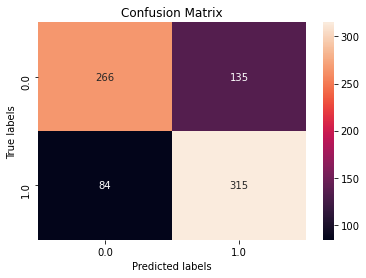

Confusion Matrix Done [ ✓ ]

Evaluating Model Performance [*]
Validation Accuracy is : 0.72625
Evaluating Model Performance [ ✓ ]

Applying K-Fold Cross Validation [*]
Accuracy: 71.56 %
Standard Deviation: 2.31 %
K-Fold Cross Validation [ ✓ ]

Complete [ ✓ ]

Time Elapsed :  0.3889470100402832 seconds 



In [379]:
params = {'algorithm': 'kd_tree', 'n_jobs': 1, 'n_neighbors': 1, 'weights': 'uniform'}
classifier =  Classification(predictor = 'knn',params=params, smote = 'y')
classifier.fit(features, labels)
result = classifier.result()
accuracy_scores[result['Classifier']] = result['Accuracy']

# Decision Trees


          
██╗░░░░░██╗░░░██╗░█████╗░██╗███████╗███████╗██████╗░░░░░░░███╗░░░███╗██╗░░░░░
██║░░░░░██║░░░██║██╔══██╗██║██╔════╝██╔════╝██╔══██╗░░░░░░████╗░████║██║░░░░░
██║░░░░░██║░░░██║██║░░╚═╝██║█████╗░░█████╗░░██████╔╝█████╗██╔████╔██║██║░░░░░
██║░░░░░██║░░░██║██║░░██╗██║██╔══╝░░██╔══╝░░██╔══██╗╚════╝██║╚██╔╝██║██║░░░░░
███████╗╚██████╔╝╚█████╔╝██║██║░░░░░███████╗██║░░██║░░░░░░██║░╚═╝░██║███████╗
╚══════╝░╚═════╝░░╚════╝░╚═╝╚═╝░░░░░╚══════╝╚═╝░░╚═╝░░░░░░╚═╝░░░░░╚═╝╚══════╝

Started LuciferML 

Checking if labels or features are categorical! [*]

Features and labels are not categorical [ ✓ ]

Checking for Categorical Variables Done [ ✓ ]

Checking for Sparse Matrix [*]

Applying SMOTE [*]

SMOTE Done [ ✓ ]

Splitting Data into Train and Validation Sets [*]

Splitting Done [ ✓ ]

Scaling Training and Test Sets [*]

Scaling Done [ ✓ ]

Training Decision Tree Classifier on Training Set [*]

Model Training Done [ ✓ ]

Predicting Data [*]

Data Prediction Done [ ✓ ]

Making Confusion Matri

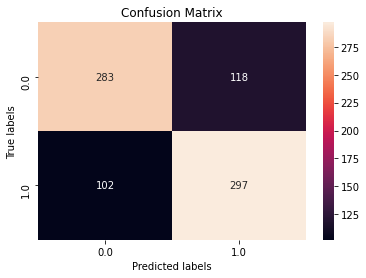

Confusion Matrix Done [ ✓ ]

Evaluating Model Performance [*]
Validation Accuracy is : 0.725
Evaluating Model Performance [ ✓ ]

Applying K-Fold Cross Validation [*]
Accuracy: 72.84 %
Standard Deviation: 2.45 %
K-Fold Cross Validation [ ✓ ]

Complete [ ✓ ]

Time Elapsed :  0.6468570232391357 seconds 



In [380]:
params = {'criterion': 'entropy', 'max_depth': 30, 'max_features': 'sqrt', 'splitter': 'best', 'random_state': 42}
classifier =  Classification(predictor = 'dt',params=params, smote = 'y')
classifier.fit(features, labels)
result = classifier.result()
accuracy_scores[result['Classifier']] = result['Accuracy']

# Random Forest Classifier


          
██╗░░░░░██╗░░░██╗░█████╗░██╗███████╗███████╗██████╗░░░░░░░███╗░░░███╗██╗░░░░░
██║░░░░░██║░░░██║██╔══██╗██║██╔════╝██╔════╝██╔══██╗░░░░░░████╗░████║██║░░░░░
██║░░░░░██║░░░██║██║░░╚═╝██║█████╗░░█████╗░░██████╔╝█████╗██╔████╔██║██║░░░░░
██║░░░░░██║░░░██║██║░░██╗██║██╔══╝░░██╔══╝░░██╔══██╗╚════╝██║╚██╔╝██║██║░░░░░
███████╗╚██████╔╝╚█████╔╝██║██║░░░░░███████╗██║░░██║░░░░░░██║░╚═╝░██║███████╗
╚══════╝░╚═════╝░░╚════╝░╚═╝╚═╝░░░░░╚══════╝╚═╝░░╚═╝░░░░░░╚═╝░░░░░╚═╝╚══════╝

Started LuciferML 

Checking if labels or features are categorical! [*]

Features and labels are not categorical [ ✓ ]

Checking for Categorical Variables Done [ ✓ ]

Checking for Sparse Matrix [*]

Applying SMOTE [*]

SMOTE Done [ ✓ ]

Splitting Data into Train and Validation Sets [*]

Splitting Done [ ✓ ]

Scaling Training and Test Sets [*]

Scaling Done [ ✓ ]

Training Random Forest Classifier on Training Set [*]

Model Training Done [ ✓ ]

Predicting Data [*]

Data Prediction Done [ ✓ ]

Making Confusion Matri

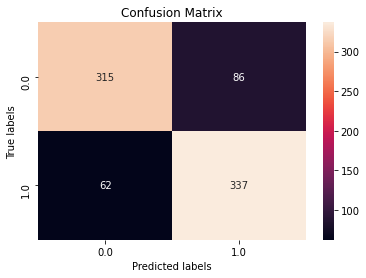

Confusion Matrix Done [ ✓ ]

Evaluating Model Performance [*]
Validation Accuracy is : 0.815
Evaluating Model Performance [ ✓ ]

Applying K-Fold Cross Validation [*]
Accuracy: 81.04 %
Standard Deviation: 1.29 %
K-Fold Cross Validation [ ✓ ]

Complete [ ✓ ]

Time Elapsed :  9.177282094955444 seconds 



In [381]:
params = {'criterion': 'gini', 'max_features': 'auto', 'n_estimators': 150,'random_state':0}
classifier =  Classification(predictor = 'rfc',params=params, smote = 'y')
classifier.fit(features, labels)
result = classifier.result()
accuracy_scores[result['Classifier']] = result['Accuracy']

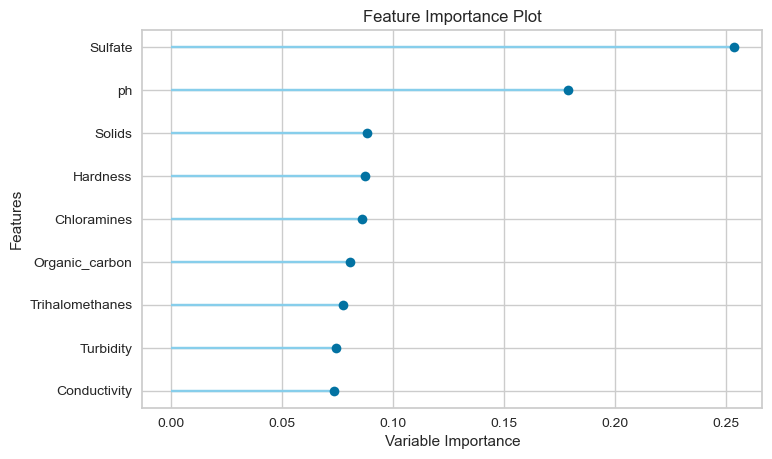

Visual Rendered Successfully
plot_model() succesfully completed......................................


In [203]:
plot_model(Random_Forest, 'feature')

# XGBOOST


          
██╗░░░░░██╗░░░██╗░█████╗░██╗███████╗███████╗██████╗░░░░░░░███╗░░░███╗██╗░░░░░
██║░░░░░██║░░░██║██╔══██╗██║██╔════╝██╔════╝██╔══██╗░░░░░░████╗░████║██║░░░░░
██║░░░░░██║░░░██║██║░░╚═╝██║█████╗░░█████╗░░██████╔╝█████╗██╔████╔██║██║░░░░░
██║░░░░░██║░░░██║██║░░██╗██║██╔══╝░░██╔══╝░░██╔══██╗╚════╝██║╚██╔╝██║██║░░░░░
███████╗╚██████╔╝╚█████╔╝██║██║░░░░░███████╗██║░░██║░░░░░░██║░╚═╝░██║███████╗
╚══════╝░╚═════╝░░╚════╝░╚═╝╚═╝░░░░░╚══════╝╚═╝░░╚═╝░░░░░░╚═╝░░░░░╚═╝╚══════╝

Started LuciferML 

Checking if labels or features are categorical! [*]

Features and labels are not categorical [ ✓ ]

Checking for Categorical Variables Done [ ✓ ]

Checking for Sparse Matrix [*]

Applying SMOTE [*]

SMOTE Done [ ✓ ]

Splitting Data into Train and Validation Sets [*]

Splitting Done [ ✓ ]

Scaling Training and Test Sets [*]

Scaling Done [ ✓ ]

Training XGBClassifier on Training Set [*]

Model Training Done [ ✓ ]

Predicting Data [*]

Data Prediction Done [ ✓ ]

Making Confusion Matrix [*]
[[296

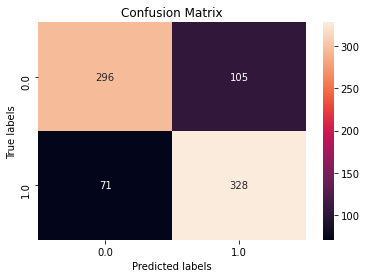

Confusion Matrix Done [ ✓ ]

Evaluating Model Performance [*]
Validation Accuracy is : 0.78
Evaluating Model Performance [ ✓ ]

Applying K-Fold Cross Validation [*]
Accuracy: 79.19 %
Standard Deviation: 1.43 %
K-Fold Cross Validation [ ✓ ]

Complete [ ✓ ]

Time Elapsed :  12.814713954925537 seconds 



In [382]:
params = {'learning_rate':0.02, 'n_estimators':600, 'objective':'binary:logistic', 'eval_metric':'logloss', 'nthread':-1}
classifier =  Classification(predictor = 'xgb',params=params, smote = 'y')
classifier.fit(features, labels)
result = classifier.result()
accuracy_scores[result['Classifier']] = result['Accuracy']

In [392]:
maxKey = max(accuracy_scores, key=lambda x: accuracy_scores[x])
print('The highest K-Fold Validation Accuracy score is  {0} with an accuracy of  {1:.2f}'.format(
    maxKey, accuracy_scores[maxKey]))

The highest K-Fold Validation Accuracy score is  Random Forest Classifier with an accuracy of  81.04


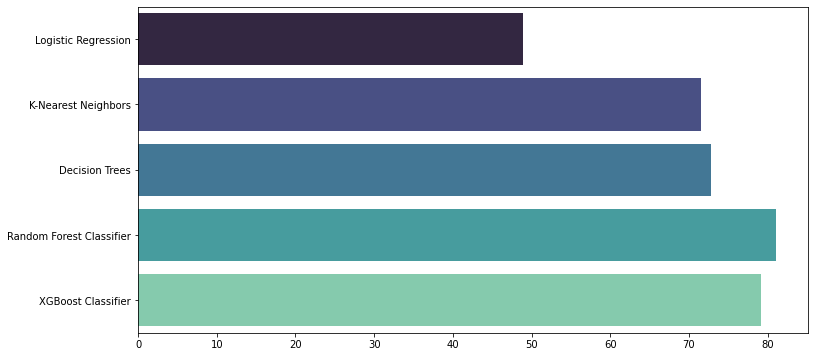

In [384]:
plt.figure(figsize=(12, 6))
model_accuracies = list(accuracy_scores.values())
model_names = list(accuracy_scores.keys())
sns.barplot(x=model_accuracies, y=model_names, palette='mako');